# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.94

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9394, 0.9321233034133911)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: zbfsqci3
Name: mythical-cantina-107
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/zbfsqci3
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155910-zbfsqci3/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2581,3301,9361
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2581,2528,1672,3460,1613,3389
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4442,10801
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 624,808,2378
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 624,674,436,830,436,810
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1142,2668
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:13<2:16:24, 13.66s/it]

Epoch 1/600:   0%|          | 1/600 [00:13<2:16:24, 13.66s/it, v_num=i3_1, total_loss_train=403, kl_local_train=55]

Epoch 2/600:   0%|          | 1/600 [00:13<2:16:24, 13.66s/it, v_num=i3_1, total_loss_train=403, kl_local_train=55]

Epoch 2/600:   0%|          | 2/600 [00:26<2:10:37, 13.11s/it, v_num=i3_1, total_loss_train=403, kl_local_train=55]

Epoch 2/600:   0%|          | 2/600 [00:26<2:10:37, 13.11s/it, v_num=i3_1, total_loss_train=221, kl_local_train=86]

Epoch 3/600:   0%|          | 2/600 [00:26<2:10:37, 13.11s/it, v_num=i3_1, total_loss_train=221, kl_local_train=86]

Epoch 3/600:   0%|          | 3/600 [00:39<2:08:51, 12.95s/it, v_num=i3_1, total_loss_train=221, kl_local_train=86]

Epoch 3/600:   0%|          | 3/600 [00:39<2:08:51, 12.95s/it, v_num=i3_1, total_loss_train=206, kl_local_train=85.7]

Epoch 4/600:   0%|          | 3/600 [00:39<2:08:51, 12.95s/it, v_num=i3_1, total_loss_train=206, kl_local_train=85.7]

Epoch 4/600:   1%|          | 4/600 [00:51<2:07:33, 12.84s/it, v_num=i3_1, total_loss_train=206, kl_local_train=85.7]

Epoch 4/600:   1%|          | 4/600 [00:51<2:07:33, 12.84s/it, v_num=i3_1, total_loss_train=202, kl_local_train=77]  

Epoch 5/600:   1%|          | 4/600 [00:51<2:07:33, 12.84s/it, v_num=i3_1, total_loss_train=202, kl_local_train=77]

Epoch 5/600:   1%|          | 5/600 [01:04<2:07:37, 12.87s/it, v_num=i3_1, total_loss_train=202, kl_local_train=77]

Epoch 5/600:   1%|          | 5/600 [01:04<2:07:37, 12.87s/it, v_num=i3_1, total_loss_train=200, kl_local_train=63.6]

Epoch 6/600:   1%|          | 5/600 [01:06<2:07:37, 12.87s/it, v_num=i3_1, total_loss_train=200, kl_local_train=63.6]

Epoch 6/600:   1%|          | 6/600 [01:18<2:09:35, 13.09s/it, v_num=i3_1, total_loss_train=200, kl_local_train=63.6]

Epoch 6/600:   1%|          | 6/600 [01:18<2:09:35, 13.09s/it, v_num=i3_1, total_loss_train=199, kl_local_train=47.3, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 6/600 [01:18<2:09:35, 13.09s/it, v_num=i3_1, total_loss_train=199, kl_local_train=47.3, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 7/600 [01:30<2:06:57, 12.85s/it, v_num=i3_1, total_loss_train=199, kl_local_train=47.3, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 7/600 [01:30<2:06:57, 12.85s/it, v_num=i3_1, total_loss_train=199, kl_local_train=30.7, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|          | 7/600 [01:30<2:06:57, 12.85s/it, v_num=i3_1, total_loss_train=199, kl_local_train=30.7, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|▏         | 8/600 [01:42<2:04:47, 12.65s/it, v_num=i3_1, total_loss_train=199, kl_local_train=30.7, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|▏         | 8/600 [01:42<2:04:47, 12.65s/it, v_num=i3_1, total_loss_train=206, kl_local_train=17, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]  

Epoch 9/600:   1%|▏         | 8/600 [01:42<2:04:47, 12.65s/it, v_num=i3_1, total_loss_train=206, kl_local_train=17, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 9/600:   2%|▏         | 9/600 [01:54<2:02:40, 12.45s/it, v_num=i3_1, total_loss_train=206, kl_local_train=17, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 9/600:   2%|▏         | 9/600 [01:54<2:02:40, 12.45s/it, v_num=i3_1, total_loss_train=214, kl_local_train=13.1, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 9/600 [01:54<2:02:40, 12.45s/it, v_num=i3_1, total_loss_train=214, kl_local_train=13.1, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 10/600 [02:06<2:01:10, 12.32s/it, v_num=i3_1, total_loss_train=214, kl_local_train=13.1, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 10/600 [02:06<2:01:10, 12.32s/it, v_num=i3_1, total_loss_train=221, kl_local_train=11.7, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 10/600 [02:08<2:01:10, 12.32s/it, v_num=i3_1, total_loss_train=221, kl_local_train=11.7, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 11/600 [02:20<2:03:36, 12.59s/it, v_num=i3_1, total_loss_train=221, kl_local_train=11.7, metric_mi|status_control_train=0.0184, metric_mi|zone_train=0.0072, metric_mi|time_cat_train=0.0122, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 11/600 [02:20<2:03:36, 12.59s/it, v_num=i3_1, total_loss_train=229, kl_local_train=12.6, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 12/600:   2%|▏         | 11/600 [02:20<2:03:36, 12.59s/it, v_num=i3_1, total_loss_train=229, kl_local_train=12.6, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 12/600:   2%|▏         | 12/600 [02:31<2:01:20, 12.38s/it, v_num=i3_1, total_loss_train=229, kl_local_train=12.6, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 12/600:   2%|▏         | 12/600 [02:31<2:01:20, 12.38s/it, v_num=i3_1, total_loss_train=236, kl_local_train=17.4, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 13/600:   2%|▏         | 12/600 [02:31<2:01:20, 12.38s/it, v_num=i3_1, total_loss_train=236, kl_local_train=17.4, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 13/600:   2%|▏         | 13/600 [02:43<1:59:34, 12.22s/it, v_num=i3_1, total_loss_train=236, kl_local_train=17.4, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 13/600:   2%|▏         | 13/600 [02:43<1:59:34, 12.22s/it, v_num=i3_1, total_loss_train=244, kl_local_train=35.2, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 14/600:   2%|▏         | 13/600 [02:43<1:59:34, 12.22s/it, v_num=i3_1, total_loss_train=244, kl_local_train=35.2, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 14/600:   2%|▏         | 14/600 [02:55<1:58:17, 12.11s/it, v_num=i3_1, total_loss_train=244, kl_local_train=35.2, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 14/600:   2%|▏         | 14/600 [02:55<1:58:17, 12.11s/it, v_num=i3_1, total_loss_train=245, kl_local_train=117, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351] 

Epoch 15/600:   2%|▏         | 14/600 [02:55<1:58:17, 12.11s/it, v_num=i3_1, total_loss_train=245, kl_local_train=117, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 15/600:   2%|▎         | 15/600 [03:07<1:57:41, 12.07s/it, v_num=i3_1, total_loss_train=245, kl_local_train=117, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 15/600:   2%|▎         | 15/600 [03:07<1:57:41, 12.07s/it, v_num=i3_1, total_loss_train=242, kl_local_train=120, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 16/600:   2%|▎         | 15/600 [03:08<1:57:41, 12.07s/it, v_num=i3_1, total_loss_train=242, kl_local_train=120, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 16/600:   3%|▎         | 16/600 [03:20<2:01:00, 12.43s/it, v_num=i3_1, total_loss_train=242, kl_local_train=120, metric_mi|status_control_train=0.0188, metric_mi|zone_train=0.0075, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0351]

Epoch 16/600:   3%|▎         | 16/600 [03:20<2:01:00, 12.43s/it, v_num=i3_1, total_loss_train=246, kl_local_train=105, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]  

Epoch 17/600:   3%|▎         | 16/600 [03:20<2:01:00, 12.43s/it, v_num=i3_1, total_loss_train=246, kl_local_train=105, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 17/600:   3%|▎         | 17/600 [03:32<1:59:18, 12.28s/it, v_num=i3_1, total_loss_train=246, kl_local_train=105, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 17/600:   3%|▎         | 17/600 [03:32<1:59:18, 12.28s/it, v_num=i3_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 18/600:   3%|▎         | 17/600 [03:32<1:59:18, 12.28s/it, v_num=i3_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 18/600:   3%|▎         | 18/600 [03:44<1:58:00, 12.17s/it, v_num=i3_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 18/600:   3%|▎         | 18/600 [03:44<1:58:00, 12.17s/it, v_num=i3_1, total_loss_train=255, kl_local_train=102, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 19/600:   3%|▎         | 18/600 [03:44<1:58:00, 12.17s/it, v_num=i3_1, total_loss_train=255, kl_local_train=102, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 19/600:   3%|▎         | 19/600 [03:56<1:57:03, 12.09s/it, v_num=i3_1, total_loss_train=255, kl_local_train=102, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 19/600:   3%|▎         | 19/600 [03:56<1:57:03, 12.09s/it, v_num=i3_1, total_loss_train=259, kl_local_train=103, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 20/600:   3%|▎         | 19/600 [03:56<1:57:03, 12.09s/it, v_num=i3_1, total_loss_train=259, kl_local_train=103, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 20/600:   3%|▎         | 20/600 [04:08<1:56:30, 12.05s/it, v_num=i3_1, total_loss_train=259, kl_local_train=103, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 20/600:   3%|▎         | 20/600 [04:08<1:56:30, 12.05s/it, v_num=i3_1, total_loss_train=262, kl_local_train=109, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 21/600:   3%|▎         | 20/600 [04:09<1:56:30, 12.05s/it, v_num=i3_1, total_loss_train=262, kl_local_train=109, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 21/600:   4%|▎         | 21/600 [04:21<1:59:49, 12.42s/it, v_num=i3_1, total_loss_train=262, kl_local_train=109, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.0739, metric_mi|mouse_train=0.0733]

Epoch 21/600:   4%|▎         | 21/600 [04:21<1:59:49, 12.42s/it, v_num=i3_1, total_loss_train=264, kl_local_train=133, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]  

Epoch 22/600:   4%|▎         | 21/600 [04:21<1:59:49, 12.42s/it, v_num=i3_1, total_loss_train=264, kl_local_train=133, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 22/600:   4%|▎         | 22/600 [04:33<1:58:14, 12.27s/it, v_num=i3_1, total_loss_train=264, kl_local_train=133, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 22/600:   4%|▎         | 22/600 [04:33<1:58:14, 12.27s/it, v_num=i3_1, total_loss_train=267, kl_local_train=155, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 23/600:   4%|▎         | 22/600 [04:33<1:58:14, 12.27s/it, v_num=i3_1, total_loss_train=267, kl_local_train=155, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 23/600:   4%|▍         | 23/600 [04:45<1:57:06, 12.18s/it, v_num=i3_1, total_loss_train=267, kl_local_train=155, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 23/600:   4%|▍         | 23/600 [04:45<1:57:06, 12.18s/it, v_num=i3_1, total_loss_train=270, kl_local_train=158, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 24/600:   4%|▍         | 23/600 [04:45<1:57:06, 12.18s/it, v_num=i3_1, total_loss_train=270, kl_local_train=158, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 24/600:   4%|▍         | 24/600 [04:57<1:56:13, 12.11s/it, v_num=i3_1, total_loss_train=270, kl_local_train=158, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 24/600:   4%|▍         | 24/600 [04:57<1:56:13, 12.11s/it, v_num=i3_1, total_loss_train=273, kl_local_train=160, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 25/600:   4%|▍         | 24/600 [04:57<1:56:13, 12.11s/it, v_num=i3_1, total_loss_train=273, kl_local_train=160, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 25/600:   4%|▍         | 25/600 [05:09<1:55:48, 12.08s/it, v_num=i3_1, total_loss_train=273, kl_local_train=160, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 25/600:   4%|▍         | 25/600 [05:09<1:55:48, 12.08s/it, v_num=i3_1, total_loss_train=277, kl_local_train=158, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 26/600:   4%|▍         | 25/600 [05:11<1:55:48, 12.08s/it, v_num=i3_1, total_loss_train=277, kl_local_train=158, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 26/600:   4%|▍         | 26/600 [05:23<1:59:01, 12.44s/it, v_num=i3_1, total_loss_train=277, kl_local_train=158, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.182, metric_mi|time_cat_train=0.115, metric_mi|mouse_train=0.0978]

Epoch 26/600:   4%|▍         | 26/600 [05:23<1:59:01, 12.44s/it, v_num=i3_1, total_loss_train=281, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137] 

Epoch 27/600:   4%|▍         | 26/600 [05:23<1:59:01, 12.44s/it, v_num=i3_1, total_loss_train=281, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|▍         | 27/600 [05:34<1:57:20, 12.29s/it, v_num=i3_1, total_loss_train=281, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|▍         | 27/600 [05:34<1:57:20, 12.29s/it, v_num=i3_1, total_loss_train=285, kl_local_train=157, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   4%|▍         | 27/600 [05:34<1:57:20, 12.29s/it, v_num=i3_1, total_loss_train=285, kl_local_train=157, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|▍         | 28/600 [05:46<1:56:07, 12.18s/it, v_num=i3_1, total_loss_train=285, kl_local_train=157, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|▍         | 28/600 [05:46<1:56:07, 12.18s/it, v_num=i3_1, total_loss_train=288, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|▍         | 28/600 [05:46<1:56:07, 12.18s/it, v_num=i3_1, total_loss_train=288, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|▍         | 29/600 [05:58<1:55:13, 12.11s/it, v_num=i3_1, total_loss_train=288, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|▍         | 29/600 [05:58<1:55:13, 12.11s/it, v_num=i3_1, total_loss_train=292, kl_local_train=156, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|▍         | 29/600 [05:58<1:55:13, 12.11s/it, v_num=i3_1, total_loss_train=292, kl_local_train=156, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|▌         | 30/600 [06:10<1:54:41, 12.07s/it, v_num=i3_1, total_loss_train=292, kl_local_train=156, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|▌         | 30/600 [06:10<1:54:41, 12.07s/it, v_num=i3_1, total_loss_train=296, kl_local_train=154, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|▌         | 30/600 [06:12<1:54:41, 12.07s/it, v_num=i3_1, total_loss_train=296, kl_local_train=154, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|▌         | 31/600 [06:24<1:57:57, 12.44s/it, v_num=i3_1, total_loss_train=296, kl_local_train=154, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|▌         | 31/600 [06:24<1:57:57, 12.44s/it, v_num=i3_1, total_loss_train=300, kl_local_train=155, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|▌         | 31/600 [06:24<1:57:57, 12.44s/it, v_num=i3_1, total_loss_train=300, kl_local_train=155, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|▌         | 32/600 [06:36<1:56:23, 12.29s/it, v_num=i3_1, total_loss_train=300, kl_local_train=155, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|▌         | 32/600 [06:36<1:56:23, 12.29s/it, v_num=i3_1, total_loss_train=304, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 33/600:   5%|▌         | 32/600 [06:36<1:56:23, 12.29s/it, v_num=i3_1, total_loss_train=304, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 33/600:   6%|▌         | 33/600 [06:48<1:55:13, 12.19s/it, v_num=i3_1, total_loss_train=304, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 33/600:   6%|▌         | 33/600 [06:48<1:55:13, 12.19s/it, v_num=i3_1, total_loss_train=308, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|▌         | 33/600 [06:48<1:55:13, 12.19s/it, v_num=i3_1, total_loss_train=308, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|▌         | 34/600 [07:00<1:54:21, 12.12s/it, v_num=i3_1, total_loss_train=308, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|▌         | 34/600 [07:00<1:54:21, 12.12s/it, v_num=i3_1, total_loss_train=312, kl_local_train=155, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|▌         | 34/600 [07:00<1:54:21, 12.12s/it, v_num=i3_1, total_loss_train=312, kl_local_train=155, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|▌         | 35/600 [07:12<1:53:50, 12.09s/it, v_num=i3_1, total_loss_train=312, kl_local_train=155, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|▌         | 35/600 [07:12<1:53:50, 12.09s/it, v_num=i3_1, total_loss_train=316, kl_local_train=148, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|▌         | 35/600 [07:13<1:53:50, 12.09s/it, v_num=i3_1, total_loss_train=316, kl_local_train=148, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|▌         | 36/600 [07:25<1:56:57, 12.44s/it, v_num=i3_1, total_loss_train=316, kl_local_train=148, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|▌         | 36/600 [07:25<1:56:57, 12.44s/it, v_num=i3_1, total_loss_train=320, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143] 

Epoch 37/600:   6%|▌         | 36/600 [07:25<1:56:57, 12.44s/it, v_num=i3_1, total_loss_train=320, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|▌         | 37/600 [07:37<1:55:20, 12.29s/it, v_num=i3_1, total_loss_train=320, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|▌         | 37/600 [07:37<1:55:20, 12.29s/it, v_num=i3_1, total_loss_train=324, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|▌         | 37/600 [07:37<1:55:20, 12.29s/it, v_num=i3_1, total_loss_train=324, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|▋         | 38/600 [07:49<1:54:10, 12.19s/it, v_num=i3_1, total_loss_train=324, kl_local_train=150, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|▋         | 38/600 [07:49<1:54:10, 12.19s/it, v_num=i3_1, total_loss_train=329, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|▋         | 38/600 [07:49<1:54:10, 12.19s/it, v_num=i3_1, total_loss_train=329, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|▋         | 39/600 [08:01<1:53:19, 12.12s/it, v_num=i3_1, total_loss_train=329, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|▋         | 39/600 [08:01<1:53:19, 12.12s/it, v_num=i3_1, total_loss_train=333, kl_local_train=152, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 40/600:   6%|▋         | 39/600 [08:01<1:53:19, 12.12s/it, v_num=i3_1, total_loss_train=333, kl_local_train=152, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 40/600:   7%|▋         | 40/600 [08:13<1:52:39, 12.07s/it, v_num=i3_1, total_loss_train=333, kl_local_train=152, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 40/600:   7%|▋         | 40/600 [08:13<1:52:39, 12.07s/it, v_num=i3_1, total_loss_train=337, kl_local_train=151, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|▋         | 40/600 [08:14<1:52:39, 12.07s/it, v_num=i3_1, total_loss_train=337, kl_local_train=151, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|▋         | 41/600 [08:26<1:55:47, 12.43s/it, v_num=i3_1, total_loss_train=337, kl_local_train=151, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|▋         | 41/600 [08:26<1:55:47, 12.43s/it, v_num=i3_1, total_loss_train=341, kl_local_train=154, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 42/600:   7%|▋         | 41/600 [08:26<1:55:47, 12.43s/it, v_num=i3_1, total_loss_train=341, kl_local_train=154, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 42/600:   7%|▋         | 42/600 [08:38<1:54:21, 12.30s/it, v_num=i3_1, total_loss_train=341, kl_local_train=154, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 42/600:   7%|▋         | 42/600 [08:38<1:54:21, 12.30s/it, v_num=i3_1, total_loss_train=344, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 43/600:   7%|▋         | 42/600 [08:38<1:54:21, 12.30s/it, v_num=i3_1, total_loss_train=344, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 43/600:   7%|▋         | 43/600 [08:50<1:53:12, 12.19s/it, v_num=i3_1, total_loss_train=344, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 43/600:   7%|▋         | 43/600 [08:50<1:53:12, 12.19s/it, v_num=i3_1, total_loss_train=349, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 44/600:   7%|▋         | 43/600 [08:50<1:53:12, 12.19s/it, v_num=i3_1, total_loss_train=349, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 44/600:   7%|▋         | 44/600 [09:02<1:52:20, 12.12s/it, v_num=i3_1, total_loss_train=349, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 44/600:   7%|▋         | 44/600 [09:02<1:52:20, 12.12s/it, v_num=i3_1, total_loss_train=353, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 45/600:   7%|▋         | 44/600 [09:02<1:52:20, 12.12s/it, v_num=i3_1, total_loss_train=353, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 45/600:   8%|▊         | 45/600 [09:14<1:52:00, 12.11s/it, v_num=i3_1, total_loss_train=353, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 45/600:   8%|▊         | 45/600 [09:14<1:52:00, 12.11s/it, v_num=i3_1, total_loss_train=357, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 46/600:   8%|▊         | 45/600 [09:15<1:52:00, 12.11s/it, v_num=i3_1, total_loss_train=357, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 46/600:   8%|▊         | 46/600 [09:27<1:55:10, 12.47s/it, v_num=i3_1, total_loss_train=357, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 46/600:   8%|▊         | 46/600 [09:27<1:55:10, 12.47s/it, v_num=i3_1, total_loss_train=361, kl_local_train=149, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]  

Epoch 47/600:   8%|▊         | 46/600 [09:27<1:55:10, 12.47s/it, v_num=i3_1, total_loss_train=361, kl_local_train=149, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 47/600:   8%|▊         | 47/600 [09:39<1:53:46, 12.34s/it, v_num=i3_1, total_loss_train=361, kl_local_train=149, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 47/600:   8%|▊         | 47/600 [09:39<1:53:46, 12.34s/it, v_num=i3_1, total_loss_train=365, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 48/600:   8%|▊         | 47/600 [09:39<1:53:46, 12.34s/it, v_num=i3_1, total_loss_train=365, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 48/600:   8%|▊         | 48/600 [09:51<1:53:04, 12.29s/it, v_num=i3_1, total_loss_train=365, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 48/600:   8%|▊         | 48/600 [09:51<1:53:04, 12.29s/it, v_num=i3_1, total_loss_train=370, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 49/600:   8%|▊         | 48/600 [09:51<1:53:04, 12.29s/it, v_num=i3_1, total_loss_train=370, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 49/600:   8%|▊         | 49/600 [10:03<1:52:05, 12.21s/it, v_num=i3_1, total_loss_train=370, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 49/600:   8%|▊         | 49/600 [10:03<1:52:05, 12.21s/it, v_num=i3_1, total_loss_train=374, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 50/600:   8%|▊         | 49/600 [10:03<1:52:05, 12.21s/it, v_num=i3_1, total_loss_train=374, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 50/600:   8%|▊         | 50/600 [10:15<1:51:37, 12.18s/it, v_num=i3_1, total_loss_train=374, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 50/600:   8%|▊         | 50/600 [10:15<1:51:37, 12.18s/it, v_num=i3_1, total_loss_train=377, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 51/600:   8%|▊         | 50/600 [10:17<1:51:37, 12.18s/it, v_num=i3_1, total_loss_train=377, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 51/600:   8%|▊         | 51/600 [10:29<1:54:31, 12.52s/it, v_num=i3_1, total_loss_train=377, kl_local_train=153, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 51/600:   8%|▊         | 51/600 [10:29<1:54:31, 12.52s/it, v_num=i3_1, total_loss_train=378, kl_local_train=151, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 52/600:   8%|▊         | 51/600 [10:29<1:54:31, 12.52s/it, v_num=i3_1, total_loss_train=378, kl_local_train=151, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 52/600:   9%|▊         | 52/600 [10:41<1:52:49, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=151, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 52/600:   9%|▊         | 52/600 [10:41<1:52:49, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=152, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 53/600:   9%|▊         | 52/600 [10:41<1:52:49, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=152, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 53/600:   9%|▉         | 53/600 [10:53<1:51:37, 12.24s/it, v_num=i3_1, total_loss_train=378, kl_local_train=152, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 53/600:   9%|▉         | 53/600 [10:53<1:51:37, 12.24s/it, v_num=i3_1, total_loss_train=377, kl_local_train=150, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 54/600:   9%|▉         | 53/600 [10:53<1:51:37, 12.24s/it, v_num=i3_1, total_loss_train=377, kl_local_train=150, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 54/600:   9%|▉         | 54/600 [11:05<1:50:43, 12.17s/it, v_num=i3_1, total_loss_train=377, kl_local_train=150, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 54/600:   9%|▉         | 54/600 [11:05<1:50:43, 12.17s/it, v_num=i3_1, total_loss_train=378, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 55/600:   9%|▉         | 54/600 [11:05<1:50:43, 12.17s/it, v_num=i3_1, total_loss_train=378, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 55/600:   9%|▉         | 55/600 [11:17<1:50:10, 12.13s/it, v_num=i3_1, total_loss_train=378, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 55/600:   9%|▉         | 55/600 [11:17<1:50:10, 12.13s/it, v_num=i3_1, total_loss_train=378, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 56/600:   9%|▉         | 55/600 [11:18<1:50:10, 12.13s/it, v_num=i3_1, total_loss_train=378, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 56/600:   9%|▉         | 56/600 [11:30<1:53:08, 12.48s/it, v_num=i3_1, total_loss_train=378, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 56/600:   9%|▉         | 56/600 [11:30<1:53:08, 12.48s/it, v_num=i3_1, total_loss_train=377, kl_local_train=146, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 57/600:   9%|▉         | 56/600 [11:30<1:53:08, 12.48s/it, v_num=i3_1, total_loss_train=377, kl_local_train=146, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 57/600:  10%|▉         | 57/600 [11:42<1:51:32, 12.33s/it, v_num=i3_1, total_loss_train=377, kl_local_train=146, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 57/600:  10%|▉         | 57/600 [11:42<1:51:32, 12.33s/it, v_num=i3_1, total_loss_train=378, kl_local_train=144, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 58/600:  10%|▉         | 57/600 [11:42<1:51:32, 12.33s/it, v_num=i3_1, total_loss_train=378, kl_local_train=144, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 58/600:  10%|▉         | 58/600 [11:54<1:50:26, 12.23s/it, v_num=i3_1, total_loss_train=378, kl_local_train=144, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 58/600:  10%|▉         | 58/600 [11:54<1:50:26, 12.23s/it, v_num=i3_1, total_loss_train=378, kl_local_train=143, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 59/600:  10%|▉         | 58/600 [11:54<1:50:26, 12.23s/it, v_num=i3_1, total_loss_train=378, kl_local_train=143, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 59/600:  10%|▉         | 59/600 [12:06<1:49:33, 12.15s/it, v_num=i3_1, total_loss_train=378, kl_local_train=143, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 59/600:  10%|▉         | 59/600 [12:06<1:49:33, 12.15s/it, v_num=i3_1, total_loss_train=377, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 60/600:  10%|▉         | 59/600 [12:06<1:49:33, 12.15s/it, v_num=i3_1, total_loss_train=377, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 60/600:  10%|█         | 60/600 [12:18<1:48:48, 12.09s/it, v_num=i3_1, total_loss_train=377, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 60/600:  10%|█         | 60/600 [12:18<1:48:48, 12.09s/it, v_num=i3_1, total_loss_train=378, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 61/600:  10%|█         | 60/600 [12:19<1:48:48, 12.09s/it, v_num=i3_1, total_loss_train=378, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 61/600:  10%|█         | 61/600 [12:31<1:51:53, 12.46s/it, v_num=i3_1, total_loss_train=378, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 61/600:  10%|█         | 61/600 [12:31<1:51:53, 12.46s/it, v_num=i3_1, total_loss_train=377, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 62/600:  10%|█         | 61/600 [12:31<1:51:53, 12.46s/it, v_num=i3_1, total_loss_train=377, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 62/600:  10%|█         | 62/600 [12:43<1:50:27, 12.32s/it, v_num=i3_1, total_loss_train=377, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 62/600:  10%|█         | 62/600 [12:43<1:50:27, 12.32s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 63/600:  10%|█         | 62/600 [12:43<1:50:27, 12.32s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 63/600:  10%|█         | 63/600 [12:55<1:49:19, 12.22s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 63/600:  10%|█         | 63/600 [12:55<1:49:19, 12.22s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 64/600:  10%|█         | 63/600 [12:55<1:49:19, 12.22s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 64/600:  11%|█         | 64/600 [13:07<1:48:29, 12.14s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 64/600:  11%|█         | 64/600 [13:07<1:48:29, 12.14s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 65/600:  11%|█         | 64/600 [13:07<1:48:29, 12.14s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 65/600:  11%|█         | 65/600 [13:19<1:47:48, 12.09s/it, v_num=i3_1, total_loss_train=378, kl_local_train=135, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 65/600:  11%|█         | 65/600 [13:19<1:47:48, 12.09s/it, v_num=i3_1, total_loss_train=378, kl_local_train=134, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 66/600:  11%|█         | 65/600 [13:20<1:47:48, 12.09s/it, v_num=i3_1, total_loss_train=378, kl_local_train=134, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 66/600:  11%|█         | 66/600 [13:32<1:50:47, 12.45s/it, v_num=i3_1, total_loss_train=378, kl_local_train=134, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 66/600:  11%|█         | 66/600 [13:32<1:50:47, 12.45s/it, v_num=i3_1, total_loss_train=378, kl_local_train=134, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 67/600:  11%|█         | 66/600 [13:32<1:50:47, 12.45s/it, v_num=i3_1, total_loss_train=378, kl_local_train=134, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 67/600:  11%|█         | 67/600 [13:44<1:49:22, 12.31s/it, v_num=i3_1, total_loss_train=378, kl_local_train=134, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 67/600:  11%|█         | 67/600 [13:44<1:49:22, 12.31s/it, v_num=i3_1, total_loss_train=378, kl_local_train=133, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 68/600:  11%|█         | 67/600 [13:44<1:49:22, 12.31s/it, v_num=i3_1, total_loss_train=378, kl_local_train=133, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 68/600:  11%|█▏        | 68/600 [13:56<1:48:15, 12.21s/it, v_num=i3_1, total_loss_train=378, kl_local_train=133, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 68/600:  11%|█▏        | 68/600 [13:56<1:48:15, 12.21s/it, v_num=i3_1, total_loss_train=378, kl_local_train=132, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 69/600:  11%|█▏        | 68/600 [13:56<1:48:15, 12.21s/it, v_num=i3_1, total_loss_train=378, kl_local_train=132, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 69/600:  12%|█▏        | 69/600 [14:08<1:47:26, 12.14s/it, v_num=i3_1, total_loss_train=378, kl_local_train=132, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 69/600:  12%|█▏        | 69/600 [14:08<1:47:26, 12.14s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 70/600:  12%|█▏        | 69/600 [14:08<1:47:26, 12.14s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 70/600:  12%|█▏        | 70/600 [14:20<1:47:00, 12.11s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 70/600:  12%|█▏        | 70/600 [14:20<1:47:00, 12.11s/it, v_num=i3_1, total_loss_train=378, kl_local_train=131, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 71/600:  12%|█▏        | 70/600 [14:22<1:47:00, 12.11s/it, v_num=i3_1, total_loss_train=378, kl_local_train=131, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 71/600:  12%|█▏        | 71/600 [14:34<1:49:59, 12.48s/it, v_num=i3_1, total_loss_train=378, kl_local_train=131, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 71/600:  12%|█▏        | 71/600 [14:34<1:49:59, 12.48s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 72/600:  12%|█▏        | 71/600 [14:34<1:49:59, 12.48s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 72/600:  12%|█▏        | 72/600 [14:46<1:48:38, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 72/600:  12%|█▏        | 72/600 [14:46<1:48:38, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 73/600:  12%|█▏        | 72/600 [14:46<1:48:38, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 73/600:  12%|█▏        | 73/600 [14:58<1:47:54, 12.28s/it, v_num=i3_1, total_loss_train=378, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 73/600:  12%|█▏        | 73/600 [14:58<1:47:54, 12.28s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 74/600:  12%|█▏        | 73/600 [14:58<1:47:54, 12.28s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 74/600:  12%|█▏        | 74/600 [15:10<1:46:57, 12.20s/it, v_num=i3_1, total_loss_train=378, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 74/600:  12%|█▏        | 74/600 [15:10<1:46:57, 12.20s/it, v_num=i3_1, total_loss_train=378, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 75/600:  12%|█▏        | 74/600 [15:10<1:46:57, 12.20s/it, v_num=i3_1, total_loss_train=378, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 75/600:  12%|█▎        | 75/600 [15:22<1:46:17, 12.15s/it, v_num=i3_1, total_loss_train=378, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 75/600:  12%|█▎        | 75/600 [15:22<1:46:17, 12.15s/it, v_num=i3_1, total_loss_train=378, kl_local_train=128, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 76/600:  12%|█▎        | 75/600 [15:23<1:46:17, 12.15s/it, v_num=i3_1, total_loss_train=378, kl_local_train=128, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 76/600:  13%|█▎        | 76/600 [15:35<1:49:08, 12.50s/it, v_num=i3_1, total_loss_train=378, kl_local_train=128, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 76/600:  13%|█▎        | 76/600 [15:35<1:49:08, 12.50s/it, v_num=i3_1, total_loss_train=378, kl_local_train=127, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]  

Epoch 77/600:  13%|█▎        | 76/600 [15:35<1:49:08, 12.50s/it, v_num=i3_1, total_loss_train=378, kl_local_train=127, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|█▎        | 77/600 [15:47<1:47:38, 12.35s/it, v_num=i3_1, total_loss_train=378, kl_local_train=127, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|█▎        | 77/600 [15:47<1:47:38, 12.35s/it, v_num=i3_1, total_loss_train=379, kl_local_train=126, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|█▎        | 77/600 [15:47<1:47:38, 12.35s/it, v_num=i3_1, total_loss_train=379, kl_local_train=126, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|█▎        | 78/600 [15:59<1:46:31, 12.25s/it, v_num=i3_1, total_loss_train=379, kl_local_train=126, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|█▎        | 78/600 [15:59<1:46:31, 12.25s/it, v_num=i3_1, total_loss_train=378, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|█▎        | 78/600 [15:59<1:46:31, 12.25s/it, v_num=i3_1, total_loss_train=378, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|█▎        | 79/600 [16:11<1:45:38, 12.17s/it, v_num=i3_1, total_loss_train=378, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|█▎        | 79/600 [16:11<1:45:38, 12.17s/it, v_num=i3_1, total_loss_train=379, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|█▎        | 79/600 [16:11<1:45:38, 12.17s/it, v_num=i3_1, total_loss_train=379, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|█▎        | 80/600 [16:23<1:44:59, 12.11s/it, v_num=i3_1, total_loss_train=379, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|█▎        | 80/600 [16:23<1:44:59, 12.11s/it, v_num=i3_1, total_loss_train=379, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 81/600:  13%|█▎        | 80/600 [16:25<1:44:59, 12.11s/it, v_num=i3_1, total_loss_train=379, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 81/600:  14%|█▎        | 81/600 [16:37<1:47:52, 12.47s/it, v_num=i3_1, total_loss_train=379, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 81/600:  14%|█▎        | 81/600 [16:37<1:47:52, 12.47s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|█▎        | 81/600 [16:37<1:47:52, 12.47s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|█▎        | 82/600 [16:49<1:46:25, 12.33s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|█▎        | 82/600 [16:49<1:46:25, 12.33s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|█▎        | 82/600 [16:49<1:46:25, 12.33s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|█▍        | 83/600 [17:01<1:45:21, 12.23s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|█▍        | 83/600 [17:01<1:45:21, 12.23s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|█▍        | 83/600 [17:01<1:45:21, 12.23s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|█▍        | 84/600 [17:13<1:44:31, 12.15s/it, v_num=i3_1, total_loss_train=379, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|█▍        | 84/600 [17:13<1:44:31, 12.15s/it, v_num=i3_1, total_loss_train=379, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|█▍        | 84/600 [17:13<1:44:31, 12.15s/it, v_num=i3_1, total_loss_train=379, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|█▍        | 85/600 [17:25<1:44:00, 12.12s/it, v_num=i3_1, total_loss_train=379, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|█▍        | 85/600 [17:25<1:44:00, 12.12s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|█▍        | 85/600 [17:26<1:44:00, 12.12s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|█▍        | 86/600 [17:38<1:46:54, 12.48s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|█▍        | 86/600 [17:38<1:46:54, 12.48s/it, v_num=i3_1, total_loss_train=379, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 87/600:  14%|█▍        | 86/600 [17:38<1:46:54, 12.48s/it, v_num=i3_1, total_loss_train=379, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 87/600:  14%|█▍        | 87/600 [17:50<1:45:25, 12.33s/it, v_num=i3_1, total_loss_train=379, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 87/600:  14%|█▍        | 87/600 [17:50<1:45:25, 12.33s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 88/600:  14%|█▍        | 87/600 [17:50<1:45:25, 12.33s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 88/600:  15%|█▍        | 88/600 [18:02<1:44:21, 12.23s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 88/600:  15%|█▍        | 88/600 [18:02<1:44:21, 12.23s/it, v_num=i3_1, total_loss_train=379, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 89/600:  15%|█▍        | 88/600 [18:02<1:44:21, 12.23s/it, v_num=i3_1, total_loss_train=379, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 89/600:  15%|█▍        | 89/600 [18:14<1:43:31, 12.16s/it, v_num=i3_1, total_loss_train=379, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 89/600:  15%|█▍        | 89/600 [18:14<1:43:31, 12.16s/it, v_num=i3_1, total_loss_train=379, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 90/600:  15%|█▍        | 89/600 [18:14<1:43:31, 12.16s/it, v_num=i3_1, total_loss_train=379, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 90/600:  15%|█▌        | 90/600 [18:26<1:43:00, 12.12s/it, v_num=i3_1, total_loss_train=379, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 90/600:  15%|█▌        | 90/600 [18:26<1:43:00, 12.12s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 91/600:  15%|█▌        | 90/600 [18:27<1:43:00, 12.12s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 91/600:  15%|█▌        | 91/600 [18:39<1:45:48, 12.47s/it, v_num=i3_1, total_loss_train=379, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 91/600:  15%|█▌        | 91/600 [18:39<1:45:48, 12.47s/it, v_num=i3_1, total_loss_train=380, kl_local_train=118, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 92/600:  15%|█▌        | 91/600 [18:39<1:45:48, 12.47s/it, v_num=i3_1, total_loss_train=380, kl_local_train=118, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 92/600:  15%|█▌        | 92/600 [18:51<1:44:26, 12.34s/it, v_num=i3_1, total_loss_train=380, kl_local_train=118, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 92/600:  15%|█▌        | 92/600 [18:51<1:44:26, 12.34s/it, v_num=i3_1, total_loss_train=380, kl_local_train=118, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 93/600:  15%|█▌        | 92/600 [18:51<1:44:26, 12.34s/it, v_num=i3_1, total_loss_train=380, kl_local_train=118, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 93/600:  16%|█▌        | 93/600 [19:03<1:43:24, 12.24s/it, v_num=i3_1, total_loss_train=380, kl_local_train=118, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 93/600:  16%|█▌        | 93/600 [19:03<1:43:24, 12.24s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 94/600:  16%|█▌        | 93/600 [19:03<1:43:24, 12.24s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 94/600:  16%|█▌        | 94/600 [19:15<1:42:34, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 94/600:  16%|█▌        | 94/600 [19:15<1:42:34, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 95/600:  16%|█▌        | 94/600 [19:15<1:42:34, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 95/600:  16%|█▌        | 95/600 [19:27<1:42:18, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 95/600:  16%|█▌        | 95/600 [19:27<1:42:18, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 96/600:  16%|█▌        | 95/600 [19:29<1:42:18, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 96/600:  16%|█▌        | 96/600 [19:41<1:44:52, 12.49s/it, v_num=i3_1, total_loss_train=380, kl_local_train=115, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 96/600:  16%|█▌        | 96/600 [19:41<1:44:52, 12.49s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 96/600 [19:41<1:44:52, 12.49s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 97/600 [19:53<1:43:31, 12.35s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 97/600 [19:53<1:43:31, 12.35s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▌        | 97/600 [19:53<1:43:31, 12.35s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▋        | 98/600 [20:05<1:42:44, 12.28s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▋        | 98/600 [20:05<1:42:44, 12.28s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 98/600 [20:05<1:42:44, 12.28s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 99/600 [20:17<1:41:52, 12.20s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 99/600 [20:17<1:41:52, 12.20s/it, v_num=i3_1, total_loss_train=380, kl_local_train=114, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 100/600:  16%|█▋        | 99/600 [20:17<1:41:52, 12.20s/it, v_num=i3_1, total_loss_train=380, kl_local_train=114, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 100/600:  17%|█▋        | 100/600 [20:29<1:41:19, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=114, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 100/600:  17%|█▋        | 100/600 [20:29<1:41:19, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 100/600 [20:30<1:41:19, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 101/600 [20:42<1:44:02, 12.51s/it, v_num=i3_1, total_loss_train=380, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 101/600 [20:42<1:44:02, 12.51s/it, v_num=i3_1, total_loss_train=381, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|█▋        | 101/600 [20:42<1:44:02, 12.51s/it, v_num=i3_1, total_loss_train=381, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|█▋        | 102/600 [20:54<1:42:36, 12.36s/it, v_num=i3_1, total_loss_train=381, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|█▋        | 102/600 [20:54<1:42:36, 12.36s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|█▋        | 102/600 [20:54<1:42:36, 12.36s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|█▋        | 103/600 [21:06<1:41:31, 12.26s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|█▋        | 103/600 [21:06<1:41:31, 12.26s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|█▋        | 103/600 [21:06<1:41:31, 12.26s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|█▋        | 104/600 [21:18<1:40:44, 12.19s/it, v_num=i3_1, total_loss_train=380, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|█▋        | 104/600 [21:18<1:40:44, 12.19s/it, v_num=i3_1, total_loss_train=380, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 105/600:  17%|█▋        | 104/600 [21:18<1:40:44, 12.19s/it, v_num=i3_1, total_loss_train=380, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|█▊        | 105/600 [21:30<1:40:17, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|█▊        | 105/600 [21:30<1:40:17, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|█▊        | 105/600 [21:32<1:40:17, 12.16s/it, v_num=i3_1, total_loss_train=380, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|█▊        | 106/600 [21:44<1:42:55, 12.50s/it, v_num=i3_1, total_loss_train=380, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|█▊        | 106/600 [21:44<1:42:55, 12.50s/it, v_num=i3_1, total_loss_train=380, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 107/600:  18%|█▊        | 106/600 [21:44<1:42:55, 12.50s/it, v_num=i3_1, total_loss_train=380, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 107/600:  18%|█▊        | 107/600 [21:56<1:41:28, 12.35s/it, v_num=i3_1, total_loss_train=380, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 107/600:  18%|█▊        | 107/600 [21:56<1:41:28, 12.35s/it, v_num=i3_1, total_loss_train=381, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 108/600:  18%|█▊        | 107/600 [21:56<1:41:28, 12.35s/it, v_num=i3_1, total_loss_train=381, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 108/600:  18%|█▊        | 108/600 [22:08<1:40:25, 12.25s/it, v_num=i3_1, total_loss_train=381, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 108/600:  18%|█▊        | 108/600 [22:08<1:40:25, 12.25s/it, v_num=i3_1, total_loss_train=381, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 109/600:  18%|█▊        | 108/600 [22:08<1:40:25, 12.25s/it, v_num=i3_1, total_loss_train=381, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 109/600:  18%|█▊        | 109/600 [22:20<1:39:38, 12.18s/it, v_num=i3_1, total_loss_train=381, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 109/600:  18%|█▊        | 109/600 [22:20<1:39:38, 12.18s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 110/600:  18%|█▊        | 109/600 [22:20<1:39:38, 12.18s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 110/600:  18%|█▊        | 110/600 [22:32<1:39:06, 12.14s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 110/600:  18%|█▊        | 110/600 [22:32<1:39:06, 12.14s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 111/600:  18%|█▊        | 110/600 [22:33<1:39:06, 12.14s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 111/600:  18%|█▊        | 111/600 [22:45<1:41:43, 12.48s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.141]

Epoch 111/600:  18%|█▊        | 111/600 [22:45<1:41:43, 12.48s/it, v_num=i3_1, total_loss_train=381, kl_local_train=106, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14] 

Epoch 112/600:  18%|█▊        | 111/600 [22:45<1:41:43, 12.48s/it, v_num=i3_1, total_loss_train=381, kl_local_train=106, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 112/600:  19%|█▊        | 112/600 [22:57<1:40:24, 12.35s/it, v_num=i3_1, total_loss_train=381, kl_local_train=106, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 112/600:  19%|█▊        | 112/600 [22:57<1:40:24, 12.35s/it, v_num=i3_1, total_loss_train=381, kl_local_train=106, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 113/600:  19%|█▊        | 112/600 [22:57<1:40:24, 12.35s/it, v_num=i3_1, total_loss_train=381, kl_local_train=106, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 113/600:  19%|█▉        | 113/600 [23:09<1:39:29, 12.26s/it, v_num=i3_1, total_loss_train=381, kl_local_train=106, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 113/600:  19%|█▉        | 113/600 [23:09<1:39:29, 12.26s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 114/600:  19%|█▉        | 113/600 [23:09<1:39:29, 12.26s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 114/600:  19%|█▉        | 114/600 [23:21<1:38:42, 12.19s/it, v_num=i3_1, total_loss_train=381, kl_local_train=107, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 114/600:  19%|█▉        | 114/600 [23:21<1:38:42, 12.19s/it, v_num=i3_1, total_loss_train=381, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 115/600:  19%|█▉        | 114/600 [23:21<1:38:42, 12.19s/it, v_num=i3_1, total_loss_train=381, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 115/600:  19%|█▉        | 115/600 [23:33<1:38:01, 12.13s/it, v_num=i3_1, total_loss_train=381, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 115/600:  19%|█▉        | 115/600 [23:33<1:38:01, 12.13s/it, v_num=i3_1, total_loss_train=381, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 116/600:  19%|█▉        | 115/600 [23:34<1:38:01, 12.13s/it, v_num=i3_1, total_loss_train=381, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 116/600:  19%|█▉        | 116/600 [23:46<1:40:41, 12.48s/it, v_num=i3_1, total_loss_train=381, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 116/600:  19%|█▉        | 116/600 [23:46<1:40:41, 12.48s/it, v_num=i3_1, total_loss_train=381, kl_local_train=104, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 117/600:  19%|█▉        | 116/600 [23:46<1:40:41, 12.48s/it, v_num=i3_1, total_loss_train=381, kl_local_train=104, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 117/600:  20%|█▉        | 117/600 [23:58<1:39:19, 12.34s/it, v_num=i3_1, total_loss_train=381, kl_local_train=104, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 117/600:  20%|█▉        | 117/600 [23:58<1:39:19, 12.34s/it, v_num=i3_1, total_loss_train=381, kl_local_train=104, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 118/600:  20%|█▉        | 117/600 [23:58<1:39:19, 12.34s/it, v_num=i3_1, total_loss_train=381, kl_local_train=104, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 118/600:  20%|█▉        | 118/600 [24:10<1:38:20, 12.24s/it, v_num=i3_1, total_loss_train=381, kl_local_train=104, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 118/600:  20%|█▉        | 118/600 [24:10<1:38:20, 12.24s/it, v_num=i3_1, total_loss_train=381, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 119/600:  20%|█▉        | 118/600 [24:10<1:38:20, 12.24s/it, v_num=i3_1, total_loss_train=381, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 119/600:  20%|█▉        | 119/600 [24:22<1:37:36, 12.18s/it, v_num=i3_1, total_loss_train=381, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 119/600:  20%|█▉        | 119/600 [24:22<1:37:36, 12.18s/it, v_num=i3_1, total_loss_train=382, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 120/600:  20%|█▉        | 119/600 [24:22<1:37:36, 12.18s/it, v_num=i3_1, total_loss_train=382, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 120/600:  20%|██        | 120/600 [24:34<1:37:09, 12.15s/it, v_num=i3_1, total_loss_train=382, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 120/600:  20%|██        | 120/600 [24:34<1:37:09, 12.15s/it, v_num=i3_1, total_loss_train=381, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 121/600:  20%|██        | 120/600 [24:36<1:37:09, 12.15s/it, v_num=i3_1, total_loss_train=381, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 121/600:  20%|██        | 121/600 [24:48<1:39:48, 12.50s/it, v_num=i3_1, total_loss_train=381, kl_local_train=103, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 121/600:  20%|██        | 121/600 [24:48<1:39:48, 12.50s/it, v_num=i3_1, total_loss_train=382, kl_local_train=103, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|██        | 121/600 [24:48<1:39:48, 12.50s/it, v_num=i3_1, total_loss_train=382, kl_local_train=103, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|██        | 122/600 [25:00<1:38:36, 12.38s/it, v_num=i3_1, total_loss_train=382, kl_local_train=103, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|██        | 122/600 [25:00<1:38:36, 12.38s/it, v_num=i3_1, total_loss_train=382, kl_local_train=102, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|██        | 122/600 [25:00<1:38:36, 12.38s/it, v_num=i3_1, total_loss_train=382, kl_local_train=102, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|██        | 123/600 [25:12<1:37:47, 12.30s/it, v_num=i3_1, total_loss_train=382, kl_local_train=102, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|██        | 123/600 [25:12<1:37:47, 12.30s/it, v_num=i3_1, total_loss_train=382, kl_local_train=101, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 124/600:  20%|██        | 123/600 [25:12<1:37:47, 12.30s/it, v_num=i3_1, total_loss_train=382, kl_local_train=101, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 124/600:  21%|██        | 124/600 [25:24<1:36:53, 12.21s/it, v_num=i3_1, total_loss_train=382, kl_local_train=101, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 124/600:  21%|██        | 124/600 [25:24<1:36:53, 12.21s/it, v_num=i3_1, total_loss_train=382, kl_local_train=101, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|██        | 124/600 [25:24<1:36:53, 12.21s/it, v_num=i3_1, total_loss_train=382, kl_local_train=101, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|██        | 125/600 [25:36<1:36:11, 12.15s/it, v_num=i3_1, total_loss_train=382, kl_local_train=101, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|██        | 125/600 [25:36<1:36:11, 12.15s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|██        | 125/600 [25:37<1:36:11, 12.15s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|██        | 126/600 [25:49<1:38:46, 12.50s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|██        | 126/600 [25:49<1:38:46, 12.50s/it, v_num=i3_1, total_loss_train=382, kl_local_train=100, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 127/600:  21%|██        | 126/600 [25:49<1:38:46, 12.50s/it, v_num=i3_1, total_loss_train=382, kl_local_train=100, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 127/600:  21%|██        | 127/600 [26:01<1:37:24, 12.36s/it, v_num=i3_1, total_loss_train=382, kl_local_train=100, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 127/600:  21%|██        | 127/600 [26:01<1:37:24, 12.36s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 128/600:  21%|██        | 127/600 [26:01<1:37:24, 12.36s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 128/600:  21%|██▏       | 128/600 [26:13<1:36:24, 12.26s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 128/600:  21%|██▏       | 128/600 [26:13<1:36:24, 12.26s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 129/600:  21%|██▏       | 128/600 [26:13<1:36:24, 12.26s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 129/600:  22%|██▏       | 129/600 [26:25<1:35:38, 12.18s/it, v_num=i3_1, total_loss_train=382, kl_local_train=99.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 129/600:  22%|██▏       | 129/600 [26:25<1:35:38, 12.18s/it, v_num=i3_1, total_loss_train=382, kl_local_train=98.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 130/600:  22%|██▏       | 129/600 [26:25<1:35:38, 12.18s/it, v_num=i3_1, total_loss_train=382, kl_local_train=98.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 130/600:  22%|██▏       | 130/600 [26:37<1:35:06, 12.14s/it, v_num=i3_1, total_loss_train=382, kl_local_train=98.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 130/600:  22%|██▏       | 130/600 [26:37<1:35:06, 12.14s/it, v_num=i3_1, total_loss_train=382, kl_local_train=98, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]  

Epoch 131/600:  22%|██▏       | 130/600 [26:39<1:35:06, 12.14s/it, v_num=i3_1, total_loss_train=382, kl_local_train=98, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 131/600:  22%|██▏       | 131/600 [26:51<1:37:43, 12.50s/it, v_num=i3_1, total_loss_train=382, kl_local_train=98, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.144]

Epoch 131/600:  22%|██▏       | 131/600 [26:51<1:37:43, 12.50s/it, v_num=i3_1, total_loss_train=383, kl_local_train=98.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 132/600:  22%|██▏       | 131/600 [26:51<1:37:43, 12.50s/it, v_num=i3_1, total_loss_train=383, kl_local_train=98.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 132/600:  22%|██▏       | 132/600 [27:03<1:36:23, 12.36s/it, v_num=i3_1, total_loss_train=383, kl_local_train=98.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 132/600:  22%|██▏       | 132/600 [27:03<1:36:23, 12.36s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 133/600:  22%|██▏       | 132/600 [27:03<1:36:23, 12.36s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 133/600:  22%|██▏       | 133/600 [27:15<1:35:23, 12.25s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 133/600:  22%|██▏       | 133/600 [27:15<1:35:23, 12.25s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 134/600:  22%|██▏       | 133/600 [27:15<1:35:23, 12.25s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 134/600:  22%|██▏       | 134/600 [27:27<1:34:39, 12.19s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 134/600:  22%|██▏       | 134/600 [27:27<1:34:39, 12.19s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 135/600:  22%|██▏       | 134/600 [27:27<1:34:39, 12.19s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 135/600:  22%|██▎       | 135/600 [27:39<1:34:03, 12.14s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 135/600:  22%|██▎       | 135/600 [27:39<1:34:03, 12.14s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 136/600:  22%|██▎       | 135/600 [27:40<1:34:03, 12.14s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 136/600:  23%|██▎       | 136/600 [27:52<1:36:37, 12.49s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.145]

Epoch 136/600:  23%|██▎       | 136/600 [27:52<1:36:37, 12.49s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 137/600:  23%|██▎       | 136/600 [27:52<1:36:37, 12.49s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 137/600:  23%|██▎       | 137/600 [28:04<1:35:22, 12.36s/it, v_num=i3_1, total_loss_train=383, kl_local_train=97.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 137/600:  23%|██▎       | 137/600 [28:04<1:35:22, 12.36s/it, v_num=i3_1, total_loss_train=383, kl_local_train=96.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 138/600:  23%|██▎       | 137/600 [28:04<1:35:22, 12.36s/it, v_num=i3_1, total_loss_train=383, kl_local_train=96.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 138/600:  23%|██▎       | 138/600 [28:16<1:34:23, 12.26s/it, v_num=i3_1, total_loss_train=383, kl_local_train=96.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 138/600:  23%|██▎       | 138/600 [28:16<1:34:23, 12.26s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 139/600:  23%|██▎       | 138/600 [28:16<1:34:23, 12.26s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 139/600:  23%|██▎       | 139/600 [28:28<1:33:41, 12.19s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 139/600:  23%|██▎       | 139/600 [28:28<1:33:41, 12.19s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 140/600:  23%|██▎       | 139/600 [28:28<1:33:41, 12.19s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 140/600:  23%|██▎       | 140/600 [28:40<1:33:05, 12.14s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 140/600:  23%|██▎       | 140/600 [28:40<1:33:05, 12.14s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 141/600:  23%|██▎       | 140/600 [28:42<1:33:05, 12.14s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 141/600:  24%|██▎       | 141/600 [28:54<1:35:42, 12.51s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.138]

Epoch 141/600:  24%|██▎       | 141/600 [28:54<1:35:42, 12.51s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]  

Epoch 142/600:  24%|██▎       | 141/600 [28:54<1:35:42, 12.51s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 142/600:  24%|██▎       | 142/600 [29:06<1:34:27, 12.38s/it, v_num=i3_1, total_loss_train=383, kl_local_train=95.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 142/600:  24%|██▎       | 142/600 [29:06<1:34:27, 12.38s/it, v_num=i3_1, total_loss_train=384, kl_local_train=95, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]  

Epoch 143/600:  24%|██▎       | 142/600 [29:06<1:34:27, 12.38s/it, v_num=i3_1, total_loss_train=384, kl_local_train=95, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 143/600:  24%|██▍       | 143/600 [29:18<1:33:29, 12.27s/it, v_num=i3_1, total_loss_train=384, kl_local_train=95, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 143/600:  24%|██▍       | 143/600 [29:18<1:33:29, 12.27s/it, v_num=i3_1, total_loss_train=384, kl_local_train=94.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 144/600:  24%|██▍       | 143/600 [29:18<1:33:29, 12.27s/it, v_num=i3_1, total_loss_train=384, kl_local_train=94.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 144/600:  24%|██▍       | 144/600 [29:30<1:32:45, 12.21s/it, v_num=i3_1, total_loss_train=384, kl_local_train=94.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 144/600:  24%|██▍       | 144/600 [29:30<1:32:45, 12.21s/it, v_num=i3_1, total_loss_train=384, kl_local_train=93.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 145/600:  24%|██▍       | 144/600 [29:30<1:32:45, 12.21s/it, v_num=i3_1, total_loss_train=384, kl_local_train=93.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 145/600:  24%|██▍       | 145/600 [29:42<1:32:12, 12.16s/it, v_num=i3_1, total_loss_train=384, kl_local_train=93.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 145/600:  24%|██▍       | 145/600 [29:42<1:32:12, 12.16s/it, v_num=i3_1, total_loss_train=384, kl_local_train=93.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 146/600:  24%|██▍       | 145/600 [29:43<1:32:12, 12.16s/it, v_num=i3_1, total_loss_train=384, kl_local_train=93.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 146/600:  24%|██▍       | 146/600 [29:55<1:34:48, 12.53s/it, v_num=i3_1, total_loss_train=384, kl_local_train=93.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.134]

Epoch 146/600:  24%|██▍       | 146/600 [29:55<1:34:48, 12.53s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 147/600:  24%|██▍       | 146/600 [29:55<1:34:48, 12.53s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 147/600:  24%|██▍       | 147/600 [30:07<1:33:50, 12.43s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 147/600:  24%|██▍       | 147/600 [30:08<1:33:50, 12.43s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 148/600:  24%|██▍       | 147/600 [30:08<1:33:50, 12.43s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 148/600:  25%|██▍       | 148/600 [30:20<1:32:50, 12.32s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 148/600:  25%|██▍       | 148/600 [30:20<1:32:50, 12.32s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 149/600:  25%|██▍       | 148/600 [30:20<1:32:50, 12.32s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 149/600:  25%|██▍       | 149/600 [30:32<1:32:04, 12.25s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 149/600:  25%|██▍       | 149/600 [30:32<1:32:04, 12.25s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 150/600:  25%|██▍       | 149/600 [30:32<1:32:04, 12.25s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 150/600:  25%|██▌       | 150/600 [30:44<1:31:22, 12.18s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 150/600:  25%|██▌       | 150/600 [30:44<1:31:22, 12.18s/it, v_num=i3_1, total_loss_train=384, kl_local_train=91.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 151/600:  25%|██▌       | 150/600 [30:45<1:31:22, 12.18s/it, v_num=i3_1, total_loss_train=384, kl_local_train=91.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 151/600:  25%|██▌       | 151/600 [30:57<1:33:46, 12.53s/it, v_num=i3_1, total_loss_train=384, kl_local_train=91.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 151/600:  25%|██▌       | 151/600 [30:57<1:33:46, 12.53s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██▌       | 151/600 [30:57<1:33:46, 12.53s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██▌       | 152/600 [31:09<1:32:29, 12.39s/it, v_num=i3_1, total_loss_train=384, kl_local_train=92.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██▌       | 152/600 [31:09<1:32:29, 12.39s/it, v_num=i3_1, total_loss_train=385, kl_local_train=91.6, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 153/600:  25%|██▌       | 152/600 [31:09<1:32:29, 12.39s/it, v_num=i3_1, total_loss_train=385, kl_local_train=91.6, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 153/600:  26%|██▌       | 153/600 [31:21<1:31:33, 12.29s/it, v_num=i3_1, total_loss_train=385, kl_local_train=91.6, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 153/600:  26%|██▌       | 153/600 [31:21<1:31:33, 12.29s/it, v_num=i3_1, total_loss_train=384, kl_local_train=91, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]  

Epoch 154/600:  26%|██▌       | 153/600 [31:21<1:31:33, 12.29s/it, v_num=i3_1, total_loss_train=384, kl_local_train=91, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██▌       | 154/600 [31:33<1:30:51, 12.22s/it, v_num=i3_1, total_loss_train=384, kl_local_train=91, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██▌       | 154/600 [31:33<1:30:51, 12.22s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██▌       | 154/600 [31:33<1:30:51, 12.22s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██▌       | 155/600 [31:45<1:30:20, 12.18s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██▌       | 155/600 [31:45<1:30:20, 12.18s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|██▌       | 155/600 [31:47<1:30:20, 12.18s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|██▌       | 156/600 [31:59<1:32:42, 12.53s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|██▌       | 156/600 [31:59<1:32:42, 12.53s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 157/600:  26%|██▌       | 156/600 [31:59<1:32:42, 12.53s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 157/600:  26%|██▌       | 157/600 [32:11<1:31:26, 12.39s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 157/600:  26%|██▌       | 157/600 [32:11<1:31:26, 12.39s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 158/600:  26%|██▌       | 157/600 [32:11<1:31:26, 12.39s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 158/600:  26%|██▋       | 158/600 [32:23<1:30:29, 12.28s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 158/600:  26%|██▋       | 158/600 [32:23<1:30:29, 12.28s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 159/600:  26%|██▋       | 158/600 [32:23<1:30:29, 12.28s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 159/600:  26%|██▋       | 159/600 [32:35<1:29:51, 12.23s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 159/600:  26%|██▋       | 159/600 [32:35<1:29:51, 12.23s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]  

Epoch 160/600:  26%|██▋       | 159/600 [32:35<1:29:51, 12.23s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 160/600:  27%|██▋       | 160/600 [32:47<1:29:12, 12.17s/it, v_num=i3_1, total_loss_train=385, kl_local_train=90, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 160/600:  27%|██▋       | 160/600 [32:47<1:29:12, 12.17s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 161/600:  27%|██▋       | 160/600 [32:48<1:29:12, 12.17s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 161/600:  27%|██▋       | 161/600 [33:00<1:31:33, 12.51s/it, v_num=i3_1, total_loss_train=385, kl_local_train=89.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 161/600:  27%|██▋       | 161/600 [33:00<1:31:33, 12.51s/it, v_num=i3_1, total_loss_train=385, kl_local_train=88.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 162/600:  27%|██▋       | 161/600 [33:00<1:31:33, 12.51s/it, v_num=i3_1, total_loss_train=385, kl_local_train=88.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 162/600:  27%|██▋       | 162/600 [33:12<1:30:18, 12.37s/it, v_num=i3_1, total_loss_train=385, kl_local_train=88.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 162/600:  27%|██▋       | 162/600 [33:12<1:30:18, 12.37s/it, v_num=i3_1, total_loss_train=385, kl_local_train=88.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 163/600:  27%|██▋       | 162/600 [33:12<1:30:18, 12.37s/it, v_num=i3_1, total_loss_train=385, kl_local_train=88.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 163/600:  27%|██▋       | 163/600 [33:24<1:29:23, 12.27s/it, v_num=i3_1, total_loss_train=385, kl_local_train=88.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 163/600:  27%|██▋       | 163/600 [33:24<1:29:23, 12.27s/it, v_num=i3_1, total_loss_train=386, kl_local_train=88.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 164/600:  27%|██▋       | 163/600 [33:24<1:29:23, 12.27s/it, v_num=i3_1, total_loss_train=386, kl_local_train=88.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 164/600:  27%|██▋       | 164/600 [33:36<1:28:44, 12.21s/it, v_num=i3_1, total_loss_train=386, kl_local_train=88.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 164/600:  27%|██▋       | 164/600 [33:36<1:28:44, 12.21s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 165/600:  27%|██▋       | 164/600 [33:36<1:28:44, 12.21s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 165/600:  28%|██▊       | 165/600 [33:48<1:28:08, 12.16s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 165/600:  28%|██▊       | 165/600 [33:48<1:28:08, 12.16s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 166/600:  28%|██▊       | 165/600 [33:50<1:28:08, 12.16s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 166/600:  28%|██▊       | 166/600 [34:02<1:30:08, 12.46s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 166/600:  28%|██▊       | 166/600 [34:02<1:30:08, 12.46s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 167/600:  28%|██▊       | 166/600 [34:02<1:30:08, 12.46s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 167/600:  28%|██▊       | 167/600 [34:13<1:28:23, 12.25s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 167/600:  28%|██▊       | 167/600 [34:13<1:28:23, 12.25s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 168/600:  28%|██▊       | 167/600 [34:13<1:28:23, 12.25s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 168/600:  28%|██▊       | 168/600 [34:25<1:27:06, 12.10s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 168/600:  28%|██▊       | 168/600 [34:25<1:27:06, 12.10s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.9, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 169/600:  28%|██▊       | 168/600 [34:25<1:27:06, 12.10s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.9, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 169/600:  28%|██▊       | 169/600 [34:37<1:26:08, 11.99s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.9, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 169/600:  28%|██▊       | 169/600 [34:37<1:26:08, 11.99s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]  

Epoch 170/600:  28%|██▊       | 169/600 [34:37<1:26:08, 11.99s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 170/600:  28%|██▊       | 170/600 [34:49<1:25:29, 11.93s/it, v_num=i3_1, total_loss_train=386, kl_local_train=87, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 170/600:  28%|██▊       | 170/600 [34:49<1:25:29, 11.93s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 171/600:  28%|██▊       | 170/600 [34:50<1:25:29, 11.93s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 171/600:  28%|██▊       | 171/600 [35:02<1:27:43, 12.27s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 171/600:  28%|██▊       | 171/600 [35:02<1:27:43, 12.27s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 172/600:  28%|██▊       | 171/600 [35:02<1:27:43, 12.27s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 172/600:  29%|██▊       | 172/600 [35:13<1:26:30, 12.13s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 172/600:  29%|██▊       | 172/600 [35:13<1:26:30, 12.13s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]  

Epoch 173/600:  29%|██▊       | 172/600 [35:13<1:26:30, 12.13s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 173/600:  29%|██▉       | 173/600 [35:25<1:25:46, 12.05s/it, v_num=i3_1, total_loss_train=386, kl_local_train=86, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 173/600:  29%|██▉       | 173/600 [35:25<1:25:46, 12.05s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 174/600:  29%|██▉       | 173/600 [35:25<1:25:46, 12.05s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 174/600:  29%|██▉       | 174/600 [35:37<1:25:04, 11.98s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 174/600:  29%|██▉       | 174/600 [35:37<1:25:04, 11.98s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 175/600:  29%|██▉       | 174/600 [35:37<1:25:04, 11.98s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 175/600:  29%|██▉       | 175/600 [35:49<1:24:23, 11.91s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 175/600:  29%|██▉       | 175/600 [35:49<1:24:23, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=85.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 176/600:  29%|██▉       | 175/600 [35:50<1:24:23, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=85.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 176/600:  29%|██▉       | 176/600 [36:02<1:26:37, 12.26s/it, v_num=i3_1, total_loss_train=387, kl_local_train=85.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 176/600:  29%|██▉       | 176/600 [36:02<1:26:37, 12.26s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 177/600:  29%|██▉       | 176/600 [36:02<1:26:37, 12.26s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 177/600:  30%|██▉       | 177/600 [36:14<1:25:22, 12.11s/it, v_num=i3_1, total_loss_train=386, kl_local_train=85.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 177/600:  30%|██▉       | 177/600 [36:14<1:25:22, 12.11s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 178/600:  30%|██▉       | 177/600 [36:14<1:25:22, 12.11s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 178/600:  30%|██▉       | 178/600 [36:25<1:24:26, 12.01s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 178/600:  30%|██▉       | 178/600 [36:25<1:24:26, 12.01s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 179/600:  30%|██▉       | 178/600 [36:25<1:24:26, 12.01s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 179/600:  30%|██▉       | 179/600 [36:37<1:23:42, 11.93s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 179/600:  30%|██▉       | 179/600 [36:37<1:23:42, 11.93s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 180/600:  30%|██▉       | 179/600 [36:37<1:23:42, 11.93s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 180/600:  30%|███       | 180/600 [36:49<1:23:09, 11.88s/it, v_num=i3_1, total_loss_train=387, kl_local_train=84.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 180/600:  30%|███       | 180/600 [36:49<1:23:09, 11.88s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 181/600:  30%|███       | 180/600 [36:50<1:23:09, 11.88s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 181/600:  30%|███       | 181/600 [37:02<1:25:23, 12.23s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 181/600:  30%|███       | 181/600 [37:02<1:25:23, 12.23s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 182/600:  30%|███       | 181/600 [37:02<1:25:23, 12.23s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 182/600:  30%|███       | 182/600 [37:14<1:24:10, 12.08s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 182/600:  30%|███       | 182/600 [37:14<1:24:10, 12.08s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.4, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 183/600:  30%|███       | 182/600 [37:14<1:24:10, 12.08s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.4, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 183/600:  30%|███       | 183/600 [37:25<1:23:16, 11.98s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.4, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 183/600:  30%|███       | 183/600 [37:25<1:23:16, 11.98s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.8, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 184/600:  30%|███       | 183/600 [37:26<1:23:16, 11.98s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.8, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 184/600:  31%|███       | 184/600 [37:37<1:22:36, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.8, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 184/600:  31%|███       | 184/600 [37:37<1:22:36, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 185/600:  31%|███       | 184/600 [37:37<1:22:36, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 185/600:  31%|███       | 185/600 [37:49<1:22:17, 11.90s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 185/600:  31%|███       | 185/600 [37:49<1:22:17, 11.90s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 186/600:  31%|███       | 185/600 [37:50<1:22:17, 11.90s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 186/600:  31%|███       | 186/600 [38:02<1:24:26, 12.24s/it, v_num=i3_1, total_loss_train=387, kl_local_train=83.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 186/600:  31%|███       | 186/600 [38:02<1:24:26, 12.24s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137] 

Epoch 187/600:  31%|███       | 186/600 [38:02<1:24:26, 12.24s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|███       | 187/600 [38:14<1:23:13, 12.09s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|███       | 187/600 [38:14<1:23:13, 12.09s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|███       | 187/600 [38:14<1:23:13, 12.09s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|███▏      | 188/600 [38:26<1:22:18, 11.99s/it, v_num=i3_1, total_loss_train=387, kl_local_train=82.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|███▏      | 188/600 [38:26<1:22:18, 11.99s/it, v_num=i3_1, total_loss_train=387, kl_local_train=81.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 189/600:  31%|███▏      | 188/600 [38:26<1:22:18, 11.99s/it, v_num=i3_1, total_loss_train=387, kl_local_train=81.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 189/600:  32%|███▏      | 189/600 [38:37<1:21:35, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=81.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 189/600:  32%|███▏      | 189/600 [38:37<1:21:35, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=81.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|███▏      | 189/600 [38:37<1:21:35, 11.91s/it, v_num=i3_1, total_loss_train=387, kl_local_train=81.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|███▏      | 190/600 [38:49<1:21:05, 11.87s/it, v_num=i3_1, total_loss_train=387, kl_local_train=81.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|███▏      | 190/600 [38:49<1:21:05, 11.87s/it, v_num=i3_1, total_loss_train=388, kl_local_train=81.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|███▏      | 190/600 [38:50<1:21:05, 11.87s/it, v_num=i3_1, total_loss_train=388, kl_local_train=81.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|███▏      | 191/600 [39:02<1:23:25, 12.24s/it, v_num=i3_1, total_loss_train=388, kl_local_train=81.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|███▏      | 191/600 [39:02<1:23:25, 12.24s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 192/600:  32%|███▏      | 191/600 [39:02<1:23:25, 12.24s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 192/600:  32%|███▏      | 192/600 [39:14<1:22:13, 12.09s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 192/600:  32%|███▏      | 192/600 [39:14<1:22:13, 12.09s/it, v_num=i3_1, total_loss_train=388, kl_local_train=81, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]  

Epoch 193/600:  32%|███▏      | 192/600 [39:14<1:22:13, 12.09s/it, v_num=i3_1, total_loss_train=388, kl_local_train=81, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 193/600:  32%|███▏      | 193/600 [39:26<1:21:20, 11.99s/it, v_num=i3_1, total_loss_train=388, kl_local_train=81, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 193/600:  32%|███▏      | 193/600 [39:26<1:21:20, 11.99s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 194/600:  32%|███▏      | 193/600 [39:26<1:21:20, 11.99s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 194/600:  32%|███▏      | 194/600 [39:37<1:20:39, 11.92s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 194/600:  32%|███▏      | 194/600 [39:37<1:20:39, 11.92s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 195/600:  32%|███▏      | 194/600 [39:38<1:20:39, 11.92s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 195/600:  32%|███▎      | 195/600 [39:49<1:20:10, 11.88s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 195/600:  32%|███▎      | 195/600 [39:49<1:20:10, 11.88s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 196/600:  32%|███▎      | 195/600 [39:51<1:20:10, 11.88s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 196/600:  33%|███▎      | 196/600 [40:02<1:22:23, 12.24s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 196/600:  33%|███▎      | 196/600 [40:02<1:22:23, 12.24s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 197/600:  33%|███▎      | 196/600 [40:02<1:22:23, 12.24s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 197/600:  33%|███▎      | 197/600 [40:14<1:21:16, 12.10s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 197/600:  33%|███▎      | 197/600 [40:14<1:21:16, 12.10s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 198/600:  33%|███▎      | 197/600 [40:14<1:21:16, 12.10s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 198/600:  33%|███▎      | 198/600 [40:26<1:20:38, 12.04s/it, v_num=i3_1, total_loss_train=388, kl_local_train=80.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 198/600:  33%|███▎      | 198/600 [40:26<1:20:38, 12.04s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 199/600:  33%|███▎      | 198/600 [40:26<1:20:38, 12.04s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 199/600:  33%|███▎      | 199/600 [40:38<1:19:55, 11.96s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 199/600:  33%|███▎      | 199/600 [40:38<1:19:55, 11.96s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 200/600:  33%|███▎      | 199/600 [40:38<1:19:55, 11.96s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 200/600:  33%|███▎      | 200/600 [40:50<1:19:24, 11.91s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 200/600:  33%|███▎      | 200/600 [40:50<1:19:24, 11.91s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 201/600:  33%|███▎      | 200/600 [40:51<1:19:24, 11.91s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 201/600:  34%|███▎      | 201/600 [41:03<1:21:29, 12.25s/it, v_num=i3_1, total_loss_train=388, kl_local_train=79.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.132]

Epoch 201/600:  34%|███▎      | 201/600 [41:03<1:21:29, 12.25s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|███▎      | 201/600 [41:03<1:21:29, 12.25s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|███▎      | 202/600 [41:14<1:20:16, 12.10s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|███▎      | 202/600 [41:14<1:20:16, 12.10s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]  

Epoch 203/600:  34%|███▎      | 202/600 [41:14<1:20:16, 12.10s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|███▍      | 203/600 [41:26<1:19:25, 12.00s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|███▍      | 203/600 [41:26<1:19:25, 12.00s/it, v_num=i3_1, total_loss_train=388, kl_local_train=78.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|███▍      | 203/600 [41:26<1:19:25, 12.00s/it, v_num=i3_1, total_loss_train=388, kl_local_train=78.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|███▍      | 204/600 [41:38<1:18:48, 11.94s/it, v_num=i3_1, total_loss_train=388, kl_local_train=78.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|███▍      | 204/600 [41:38<1:18:48, 11.94s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]  

Epoch 205/600:  34%|███▍      | 204/600 [41:38<1:18:48, 11.94s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|███▍      | 205/600 [41:50<1:18:23, 11.91s/it, v_num=i3_1, total_loss_train=389, kl_local_train=79, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|███▍      | 205/600 [41:50<1:18:23, 11.91s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|███▍      | 205/600 [41:51<1:18:23, 11.91s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|███▍      | 206/600 [42:03<1:20:56, 12.33s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|███▍      | 206/600 [42:03<1:20:56, 12.33s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 207/600:  34%|███▍      | 206/600 [42:03<1:20:56, 12.33s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 207/600:  34%|███▍      | 207/600 [42:15<1:20:02, 12.22s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 207/600:  34%|███▍      | 207/600 [42:15<1:20:02, 12.22s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]  

Epoch 208/600:  34%|███▍      | 207/600 [42:15<1:20:02, 12.22s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 208/600:  35%|███▍      | 208/600 [42:27<1:19:13, 12.13s/it, v_num=i3_1, total_loss_train=389, kl_local_train=78, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 208/600:  35%|███▍      | 208/600 [42:27<1:19:13, 12.13s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 209/600:  35%|███▍      | 208/600 [42:27<1:19:13, 12.13s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 209/600:  35%|███▍      | 209/600 [42:39<1:18:21, 12.02s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 209/600:  35%|███▍      | 209/600 [42:39<1:18:21, 12.02s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]  

Epoch 210/600:  35%|███▍      | 209/600 [42:39<1:18:21, 12.02s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 210/600:  35%|███▌      | 210/600 [42:51<1:17:46, 11.96s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 210/600:  35%|███▌      | 210/600 [42:51<1:17:46, 11.96s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 211/600:  35%|███▌      | 210/600 [42:52<1:17:46, 11.96s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 211/600:  35%|███▌      | 211/600 [43:04<1:19:47, 12.31s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 211/600:  35%|███▌      | 211/600 [43:04<1:19:47, 12.31s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 212/600:  35%|███▌      | 211/600 [43:04<1:19:47, 12.31s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 212/600:  35%|███▌      | 212/600 [43:15<1:18:37, 12.16s/it, v_num=i3_1, total_loss_train=389, kl_local_train=77.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 212/600:  35%|███▌      | 212/600 [43:16<1:18:37, 12.16s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 213/600:  35%|███▌      | 212/600 [43:16<1:18:37, 12.16s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 213/600:  36%|███▌      | 213/600 [43:27<1:17:44, 12.05s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 213/600:  36%|███▌      | 213/600 [43:27<1:17:44, 12.05s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 214/600:  36%|███▌      | 213/600 [43:27<1:17:44, 12.05s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 214/600:  36%|███▌      | 214/600 [43:39<1:17:02, 11.98s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 214/600:  36%|███▌      | 214/600 [43:39<1:17:02, 11.98s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 215/600:  36%|███▌      | 214/600 [43:39<1:17:02, 11.98s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 215/600:  36%|███▌      | 215/600 [43:51<1:16:35, 11.94s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 215/600:  36%|███▌      | 215/600 [43:51<1:16:35, 11.94s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 216/600:  36%|███▌      | 215/600 [43:52<1:16:35, 11.94s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 216/600:  36%|███▌      | 216/600 [44:04<1:18:38, 12.29s/it, v_num=i3_1, total_loss_train=389, kl_local_train=76.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 216/600:  36%|███▌      | 216/600 [44:04<1:18:38, 12.29s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 217/600:  36%|███▌      | 216/600 [44:04<1:18:38, 12.29s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 217/600:  36%|███▌      | 217/600 [44:16<1:17:31, 12.14s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 217/600:  36%|███▌      | 217/600 [44:16<1:17:31, 12.14s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 218/600:  36%|███▌      | 217/600 [44:16<1:17:31, 12.14s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 218/600:  36%|███▋      | 218/600 [44:28<1:16:37, 12.04s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 218/600:  36%|███▋      | 218/600 [44:28<1:16:37, 12.04s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]  

Epoch 219/600:  36%|███▋      | 218/600 [44:28<1:16:37, 12.04s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 219/600:  36%|███▋      | 219/600 [44:39<1:15:57, 11.96s/it, v_num=i3_1, total_loss_train=390, kl_local_train=76, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 219/600:  36%|███▋      | 219/600 [44:39<1:15:57, 11.96s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 220/600:  36%|███▋      | 219/600 [44:39<1:15:57, 11.96s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 220/600:  37%|███▋      | 220/600 [44:51<1:15:28, 11.92s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 220/600:  37%|███▋      | 220/600 [44:51<1:15:28, 11.92s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 221/600:  37%|███▋      | 220/600 [44:53<1:15:28, 11.92s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 221/600:  37%|███▋      | 221/600 [45:04<1:17:33, 12.28s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.134]

Epoch 221/600:  37%|███▋      | 221/600 [45:04<1:17:33, 12.28s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 222/600:  37%|███▋      | 221/600 [45:04<1:17:33, 12.28s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 222/600:  37%|███▋      | 222/600 [45:16<1:16:30, 12.14s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 222/600:  37%|███▋      | 222/600 [45:16<1:16:30, 12.14s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]  

Epoch 223/600:  37%|███▋      | 222/600 [45:16<1:16:30, 12.14s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 223/600:  37%|███▋      | 223/600 [45:28<1:15:52, 12.07s/it, v_num=i3_1, total_loss_train=390, kl_local_train=75, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 223/600:  37%|███▋      | 223/600 [45:28<1:15:52, 12.07s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 224/600:  37%|███▋      | 223/600 [45:28<1:15:52, 12.07s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 224/600:  37%|███▋      | 224/600 [45:40<1:15:10, 12.00s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 224/600:  37%|███▋      | 224/600 [45:40<1:15:10, 12.00s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 225/600:  37%|███▋      | 224/600 [45:40<1:15:10, 12.00s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 225/600:  38%|███▊      | 225/600 [45:52<1:14:43, 11.96s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 225/600:  38%|███▊      | 225/600 [45:52<1:14:43, 11.96s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 226/600:  38%|███▊      | 225/600 [45:53<1:14:43, 11.96s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 226/600:  38%|███▊      | 226/600 [46:05<1:16:39, 12.30s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.3, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 226/600:  38%|███▊      | 226/600 [46:05<1:16:39, 12.30s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]   

Epoch 227/600:  38%|███▊      | 226/600 [46:05<1:16:39, 12.30s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 227/600:  38%|███▊      | 227/600 [46:17<1:15:32, 12.15s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 227/600:  38%|███▊      | 227/600 [46:17<1:15:32, 12.15s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 228/600:  38%|███▊      | 227/600 [46:17<1:15:32, 12.15s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 228/600:  38%|███▊      | 228/600 [46:29<1:14:41, 12.05s/it, v_num=i3_1, total_loss_train=390, kl_local_train=74.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 228/600:  38%|███▊      | 228/600 [46:29<1:14:41, 12.05s/it, v_num=i3_1, total_loss_train=391, kl_local_train=74.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 229/600:  38%|███▊      | 228/600 [46:29<1:14:41, 12.05s/it, v_num=i3_1, total_loss_train=391, kl_local_train=74.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 229/600:  38%|███▊      | 229/600 [46:40<1:14:01, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=74.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 229/600:  38%|███▊      | 229/600 [46:40<1:14:01, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 230/600:  38%|███▊      | 229/600 [46:40<1:14:01, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 230/600:  38%|███▊      | 230/600 [46:52<1:13:47, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 230/600:  38%|███▊      | 230/600 [46:52<1:13:47, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 231/600:  38%|███▊      | 230/600 [46:54<1:13:47, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 231/600:  38%|███▊      | 231/600 [47:05<1:15:39, 12.30s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.14]

Epoch 231/600:  38%|███▊      | 231/600 [47:05<1:15:39, 12.30s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 232/600:  38%|███▊      | 231/600 [47:05<1:15:39, 12.30s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 232/600:  39%|███▊      | 232/600 [47:17<1:14:30, 12.15s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 232/600:  39%|███▊      | 232/600 [47:17<1:14:30, 12.15s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 233/600:  39%|███▊      | 232/600 [47:17<1:14:30, 12.15s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 233/600:  39%|███▉      | 233/600 [47:29<1:13:43, 12.05s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 233/600:  39%|███▉      | 233/600 [47:29<1:13:43, 12.05s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 234/600:  39%|███▉      | 233/600 [47:29<1:13:43, 12.05s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 234/600:  39%|███▉      | 234/600 [47:41<1:13:05, 11.98s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 234/600:  39%|███▉      | 234/600 [47:41<1:13:05, 11.98s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 235/600:  39%|███▉      | 234/600 [47:41<1:13:05, 11.98s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 235/600:  39%|███▉      | 235/600 [47:53<1:12:37, 11.94s/it, v_num=i3_1, total_loss_train=391, kl_local_train=73.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 235/600:  39%|███▉      | 235/600 [47:53<1:12:37, 11.94s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 236/600:  39%|███▉      | 235/600 [47:54<1:12:37, 11.94s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 236/600:  39%|███▉      | 236/600 [48:06<1:14:30, 12.28s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 236/600:  39%|███▉      | 236/600 [48:06<1:14:30, 12.28s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141] 

Epoch 237/600:  39%|███▉      | 236/600 [48:06<1:14:30, 12.28s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 237/600:  40%|███▉      | 237/600 [48:17<1:13:24, 12.13s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 237/600:  40%|███▉      | 237/600 [48:17<1:13:24, 12.13s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 238/600:  40%|███▉      | 237/600 [48:18<1:13:24, 12.13s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 238/600:  40%|███▉      | 238/600 [48:29<1:12:38, 12.04s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 238/600:  40%|███▉      | 238/600 [48:29<1:12:38, 12.04s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 239/600:  40%|███▉      | 238/600 [48:29<1:12:38, 12.04s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 239/600:  40%|███▉      | 239/600 [48:41<1:12:02, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 239/600:  40%|███▉      | 239/600 [48:41<1:12:02, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 240/600:  40%|███▉      | 239/600 [48:41<1:12:02, 11.97s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 240/600:  40%|████      | 240/600 [48:53<1:11:29, 11.91s/it, v_num=i3_1, total_loss_train=391, kl_local_train=72.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 240/600:  40%|████      | 240/600 [48:53<1:11:29, 11.91s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 241/600:  40%|████      | 240/600 [48:54<1:11:29, 11.91s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 241/600:  40%|████      | 241/600 [49:06<1:13:24, 12.27s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 241/600:  40%|████      | 241/600 [49:06<1:13:24, 12.27s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141] 

Epoch 242/600:  40%|████      | 241/600 [49:06<1:13:24, 12.27s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 242/600:  40%|████      | 242/600 [49:18<1:12:22, 12.13s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 242/600:  40%|████      | 242/600 [49:18<1:12:22, 12.13s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 243/600:  40%|████      | 242/600 [49:18<1:12:22, 12.13s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 243/600:  40%|████      | 243/600 [49:30<1:11:32, 12.02s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 243/600:  40%|████      | 243/600 [49:30<1:11:32, 12.02s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]  

Epoch 244/600:  40%|████      | 243/600 [49:30<1:11:32, 12.02s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 244/600:  41%|████      | 244/600 [49:41<1:10:56, 11.96s/it, v_num=i3_1, total_loss_train=392, kl_local_train=72, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 244/600:  41%|████      | 244/600 [49:41<1:10:56, 11.96s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 245/600:  41%|████      | 244/600 [49:41<1:10:56, 11.96s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 245/600:  41%|████      | 245/600 [49:53<1:10:33, 11.93s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 245/600:  41%|████      | 245/600 [49:53<1:10:33, 11.93s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 246/600:  41%|████      | 245/600 [49:55<1:10:33, 11.93s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 246/600:  41%|████      | 246/600 [50:06<1:12:28, 12.28s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.141]

Epoch 246/600:  41%|████      | 246/600 [50:06<1:12:28, 12.28s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]   

Epoch 247/600:  41%|████      | 246/600 [50:06<1:12:28, 12.28s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 247/600:  41%|████      | 247/600 [50:18<1:11:28, 12.15s/it, v_num=i3_1, total_loss_train=392, kl_local_train=71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 247/600:  41%|████      | 247/600 [50:18<1:11:28, 12.15s/it, v_num=i3_1, total_loss_train=393, kl_local_train=70.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 248/600:  41%|████      | 247/600 [50:18<1:11:28, 12.15s/it, v_num=i3_1, total_loss_train=393, kl_local_train=70.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 248/600:  41%|████▏     | 248/600 [50:30<1:10:46, 12.06s/it, v_num=i3_1, total_loss_train=393, kl_local_train=70.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 248/600:  41%|████▏     | 248/600 [50:30<1:10:46, 12.06s/it, v_num=i3_1, total_loss_train=393, kl_local_train=70.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 249/600:  41%|████▏     | 248/600 [50:30<1:10:46, 12.06s/it, v_num=i3_1, total_loss_train=393, kl_local_train=70.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 249/600:  42%|████▏     | 249/600 [50:42<1:10:05, 11.98s/it, v_num=i3_1, total_loss_train=393, kl_local_train=70.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 249/600:  42%|████▏     | 249/600 [50:42<1:10:05, 11.98s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 250/600:  42%|████▏     | 249/600 [50:42<1:10:05, 11.98s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 250/600:  42%|████▏     | 250/600 [50:54<1:09:39, 11.94s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 250/600:  42%|████▏     | 250/600 [50:54<1:09:39, 11.94s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 251/600:  42%|████▏     | 250/600 [50:55<1:09:39, 11.94s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 251/600:  42%|████▏     | 251/600 [51:07<1:11:28, 12.29s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.137]

Epoch 251/600:  42%|████▏     | 251/600 [51:07<1:11:28, 12.29s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 252/600:  42%|████▏     | 251/600 [51:07<1:11:28, 12.29s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 252/600:  42%|████▏     | 252/600 [51:19<1:10:25, 12.14s/it, v_num=i3_1, total_loss_train=392, kl_local_train=70.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 252/600:  42%|████▏     | 252/600 [51:19<1:10:25, 12.14s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 253/600:  42%|████▏     | 252/600 [51:19<1:10:25, 12.14s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 253/600:  42%|████▏     | 253/600 [51:30<1:09:38, 12.04s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 253/600:  42%|████▏     | 253/600 [51:30<1:09:38, 12.04s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 254/600:  42%|████▏     | 253/600 [51:30<1:09:38, 12.04s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 254/600:  42%|████▏     | 254/600 [51:42<1:09:02, 11.97s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 254/600:  42%|████▏     | 254/600 [51:42<1:09:02, 11.97s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 255/600:  42%|████▏     | 254/600 [51:42<1:09:02, 11.97s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 255/600:  42%|████▎     | 255/600 [51:54<1:08:30, 11.91s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 255/600:  42%|████▎     | 255/600 [51:54<1:08:30, 11.91s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 256/600:  42%|████▎     | 255/600 [51:55<1:08:30, 11.91s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 256/600:  43%|████▎     | 256/600 [52:07<1:10:18, 12.26s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.131]

Epoch 256/600:  43%|████▎     | 256/600 [52:07<1:10:18, 12.26s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 257/600:  43%|████▎     | 256/600 [52:07<1:10:18, 12.26s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 257/600:  43%|████▎     | 257/600 [52:19<1:09:19, 12.13s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 257/600:  43%|████▎     | 257/600 [52:19<1:09:19, 12.13s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 258/600:  43%|████▎     | 257/600 [52:19<1:09:19, 12.13s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 258/600:  43%|████▎     | 258/600 [52:31<1:08:39, 12.05s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 258/600:  43%|████▎     | 258/600 [52:31<1:08:39, 12.05s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 259/600:  43%|████▎     | 258/600 [52:31<1:08:39, 12.05s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 259/600:  43%|████▎     | 259/600 [52:43<1:08:29, 12.05s/it, v_num=i3_1, total_loss_train=393, kl_local_train=69.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 259/600:  43%|████▎     | 259/600 [52:43<1:08:29, 12.05s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.9, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 260/600:  43%|████▎     | 259/600 [52:43<1:08:29, 12.05s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.9, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 260/600:  43%|████▎     | 260/600 [52:55<1:08:26, 12.08s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.9, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 260/600:  43%|████▎     | 260/600 [52:55<1:08:26, 12.08s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 261/600:  43%|████▎     | 260/600 [52:56<1:08:26, 12.08s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 261/600:  44%|████▎     | 261/600 [53:08<1:10:26, 12.47s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 261/600:  44%|████▎     | 261/600 [53:08<1:10:26, 12.47s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 262/600:  44%|████▎     | 261/600 [53:08<1:10:26, 12.47s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 262/600:  44%|████▎     | 262/600 [53:20<1:09:34, 12.35s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 262/600:  44%|████▎     | 262/600 [53:20<1:09:34, 12.35s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 263/600:  44%|████▎     | 262/600 [53:20<1:09:34, 12.35s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 263/600:  44%|████▍     | 263/600 [53:32<1:08:57, 12.28s/it, v_num=i3_1, total_loss_train=393, kl_local_train=68.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 263/600:  44%|████▍     | 263/600 [53:32<1:08:57, 12.28s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 264/600:  44%|████▍     | 263/600 [53:33<1:08:57, 12.28s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 264/600:  44%|████▍     | 264/600 [53:45<1:08:24, 12.22s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 264/600:  44%|████▍     | 264/600 [53:45<1:08:24, 12.22s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 265/600:  44%|████▍     | 264/600 [53:45<1:08:24, 12.22s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 265/600:  44%|████▍     | 265/600 [53:57<1:08:00, 12.18s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 265/600:  44%|████▍     | 265/600 [53:57<1:08:00, 12.18s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 266/600:  44%|████▍     | 265/600 [53:58<1:08:00, 12.18s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 266/600:  44%|████▍     | 266/600 [54:10<1:09:47, 12.54s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.138]

Epoch 266/600:  44%|████▍     | 266/600 [54:10<1:09:47, 12.54s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]  

Epoch 267/600:  44%|████▍     | 266/600 [54:10<1:09:47, 12.54s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 267/600:  44%|████▍     | 267/600 [54:22<1:08:47, 12.40s/it, v_num=i3_1, total_loss_train=394, kl_local_train=68, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 267/600:  44%|████▍     | 267/600 [54:22<1:08:47, 12.40s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 268/600:  44%|████▍     | 267/600 [54:22<1:08:47, 12.40s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 268/600:  45%|████▍     | 268/600 [54:34<1:08:00, 12.29s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 268/600:  45%|████▍     | 268/600 [54:34<1:08:00, 12.29s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 269/600:  45%|████▍     | 268/600 [54:34<1:08:00, 12.29s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 269/600:  45%|████▍     | 269/600 [54:46<1:07:26, 12.23s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 269/600:  45%|████▍     | 269/600 [54:46<1:07:26, 12.23s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 270/600:  45%|████▍     | 269/600 [54:46<1:07:26, 12.23s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 270/600:  45%|████▌     | 270/600 [54:58<1:06:58, 12.18s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 270/600:  45%|████▌     | 270/600 [54:58<1:06:58, 12.18s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 271/600:  45%|████▌     | 270/600 [55:00<1:06:58, 12.18s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 271/600:  45%|████▌     | 271/600 [55:12<1:08:47, 12.55s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.139]

Epoch 271/600:  45%|████▌     | 271/600 [55:12<1:08:47, 12.55s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 272/600:  45%|████▌     | 271/600 [55:12<1:08:47, 12.55s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 272/600:  45%|████▌     | 272/600 [55:24<1:07:50, 12.41s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 272/600:  45%|████▌     | 272/600 [55:24<1:07:50, 12.41s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 273/600:  45%|████▌     | 272/600 [55:24<1:07:50, 12.41s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 273/600:  46%|████▌     | 273/600 [55:36<1:07:07, 12.32s/it, v_num=i3_1, total_loss_train=394, kl_local_train=67.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 273/600:  46%|████▌     | 273/600 [55:36<1:07:07, 12.32s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 274/600:  46%|████▌     | 273/600 [55:36<1:07:07, 12.32s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 274/600:  46%|████▌     | 274/600 [55:48<1:06:29, 12.24s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 274/600:  46%|████▌     | 274/600 [55:48<1:06:29, 12.24s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 275/600:  46%|████▌     | 274/600 [55:48<1:06:29, 12.24s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 275/600:  46%|████▌     | 275/600 [56:00<1:05:54, 12.17s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 275/600:  46%|████▌     | 275/600 [56:00<1:05:54, 12.17s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 276/600:  46%|████▌     | 275/600 [56:01<1:05:54, 12.17s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 276/600:  46%|████▌     | 276/600 [56:13<1:07:37, 12.52s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.135]

Epoch 276/600:  46%|████▌     | 276/600 [56:13<1:07:37, 12.52s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]  

Epoch 277/600:  46%|████▌     | 276/600 [56:13<1:07:37, 12.52s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 277/600:  46%|████▌     | 277/600 [56:25<1:06:41, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 277/600:  46%|████▌     | 277/600 [56:25<1:06:41, 12.39s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 278/600:  46%|████▌     | 277/600 [56:25<1:06:41, 12.39s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 278/600:  46%|████▋     | 278/600 [56:37<1:05:58, 12.29s/it, v_num=i3_1, total_loss_train=394, kl_local_train=66.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 278/600:  46%|████▋     | 278/600 [56:37<1:05:58, 12.29s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 279/600:  46%|████▋     | 278/600 [56:37<1:05:58, 12.29s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 279/600:  46%|████▋     | 279/600 [56:50<1:05:24, 12.23s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 279/600:  46%|████▋     | 279/600 [56:50<1:05:24, 12.23s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 280/600:  46%|████▋     | 279/600 [56:50<1:05:24, 12.23s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 280/600:  47%|████▋     | 280/600 [57:02<1:05:01, 12.19s/it, v_num=i3_1, total_loss_train=395, kl_local_train=66.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 280/600:  47%|████▋     | 280/600 [57:02<1:05:01, 12.19s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 281/600:  47%|████▋     | 280/600 [57:03<1:05:01, 12.19s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 281/600:  47%|████▋     | 281/600 [57:15<1:06:39, 12.54s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.133]

Epoch 281/600:  47%|████▋     | 281/600 [57:15<1:06:39, 12.54s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 282/600:  47%|████▋     | 281/600 [57:15<1:06:39, 12.54s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 282/600:  47%|████▋     | 282/600 [57:27<1:05:39, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 282/600:  47%|████▋     | 282/600 [57:27<1:05:39, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 283/600:  47%|████▋     | 282/600 [57:27<1:05:39, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 283/600:  47%|████▋     | 283/600 [57:39<1:04:53, 12.28s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 283/600:  47%|████▋     | 283/600 [57:39<1:04:53, 12.28s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 284/600:  47%|████▋     | 283/600 [57:39<1:04:53, 12.28s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 284/600:  47%|████▋     | 284/600 [57:51<1:04:20, 12.22s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 284/600:  47%|████▋     | 284/600 [57:51<1:04:20, 12.22s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 285/600:  47%|████▋     | 284/600 [57:51<1:04:20, 12.22s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 285/600:  48%|████▊     | 285/600 [58:03<1:03:54, 12.17s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 285/600:  48%|████▊     | 285/600 [58:03<1:03:54, 12.17s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 286/600:  48%|████▊     | 285/600 [58:04<1:03:54, 12.17s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 286/600:  48%|████▊     | 286/600 [58:17<1:05:35, 12.53s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.131]

Epoch 286/600:  48%|████▊     | 286/600 [58:17<1:05:35, 12.53s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]  

Epoch 287/600:  48%|████▊     | 286/600 [58:17<1:05:35, 12.53s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 287/600:  48%|████▊     | 287/600 [58:29<1:04:38, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 287/600:  48%|████▊     | 287/600 [58:29<1:04:38, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 288/600:  48%|████▊     | 287/600 [58:29<1:04:38, 12.39s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 288/600:  48%|████▊     | 288/600 [58:41<1:03:57, 12.30s/it, v_num=i3_1, total_loss_train=395, kl_local_train=65.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 288/600:  48%|████▊     | 288/600 [58:41<1:03:57, 12.30s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 289/600:  48%|████▊     | 288/600 [58:41<1:03:57, 12.30s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 289/600:  48%|████▊     | 289/600 [58:53<1:03:23, 12.23s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 289/600:  48%|████▊     | 289/600 [58:53<1:03:23, 12.23s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 290/600:  48%|████▊     | 289/600 [58:53<1:03:23, 12.23s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 290/600:  48%|████▊     | 290/600 [59:05<1:02:57, 12.18s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 290/600:  48%|████▊     | 290/600 [59:05<1:02:57, 12.18s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 291/600:  48%|████▊     | 290/600 [59:06<1:02:57, 12.18s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 291/600:  48%|████▊     | 291/600 [59:18<1:04:37, 12.55s/it, v_num=i3_1, total_loss_train=395, kl_local_train=64.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 291/600:  48%|████▊     | 291/600 [59:18<1:04:37, 12.55s/it, v_num=i3_1, total_loss_train=395, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 292/600:  48%|████▊     | 291/600 [59:18<1:04:37, 12.55s/it, v_num=i3_1, total_loss_train=395, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 292/600:  49%|████▊     | 292/600 [59:30<1:03:44, 12.42s/it, v_num=i3_1, total_loss_train=395, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 292/600:  49%|████▊     | 292/600 [59:30<1:03:44, 12.42s/it, v_num=i3_1, total_loss_train=396, kl_local_train=64.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████▊     | 292/600 [59:30<1:03:44, 12.42s/it, v_num=i3_1, total_loss_train=396, kl_local_train=64.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████▉     | 293/600 [59:42<1:02:59, 12.31s/it, v_num=i3_1, total_loss_train=396, kl_local_train=64.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████▉     | 293/600 [59:42<1:02:59, 12.31s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|████▉     | 293/600 [59:42<1:02:59, 12.31s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|████▉     | 294/600 [59:54<1:02:26, 12.24s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|████▉     | 294/600 [59:54<1:02:26, 12.24s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|████▉     | 294/600 [59:55<1:02:26, 12.24s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|████▉     | 295/600 [1:00:07<1:02:02, 12.21s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|████▉     | 295/600 [1:00:07<1:02:02, 12.21s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|████▉     | 295/600 [1:00:08<1:02:02, 12.21s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|████▉     | 296/600 [1:00:20<1:03:40, 12.57s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|████▉     | 296/600 [1:00:20<1:03:40, 12.57s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 297/600:  49%|████▉     | 296/600 [1:00:20<1:03:40, 12.57s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 297/600:  50%|████▉     | 297/600 [1:00:32<1:02:51, 12.45s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 297/600:  50%|████▉     | 297/600 [1:00:32<1:02:51, 12.45s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|████▉     | 297/600 [1:00:32<1:02:51, 12.45s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|████▉     | 298/600 [1:00:44<1:02:04, 12.33s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|████▉     | 298/600 [1:00:44<1:02:04, 12.33s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|████▉     | 298/600 [1:00:44<1:02:04, 12.33s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|████▉     | 299/600 [1:00:56<1:01:26, 12.25s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|████▉     | 299/600 [1:00:56<1:01:26, 12.25s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]  

Epoch 300/600:  50%|████▉     | 299/600 [1:00:56<1:01:26, 12.25s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|█████     | 300/600 [1:01:08<1:01:03, 12.21s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|█████     | 300/600 [1:01:08<1:01:03, 12.21s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|█████     | 300/600 [1:01:10<1:01:03, 12.21s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|█████     | 301/600 [1:01:22<1:02:35, 12.56s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|█████     | 301/600 [1:01:22<1:02:35, 12.56s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 302/600:  50%|█████     | 301/600 [1:01:22<1:02:35, 12.56s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 302/600:  50%|█████     | 302/600 [1:01:34<1:01:41, 12.42s/it, v_num=i3_1, total_loss_train=396, kl_local_train=63.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 302/600:  50%|█████     | 302/600 [1:01:34<1:01:41, 12.42s/it, v_num=i3_1, total_loss_train=396, kl_local_train=62.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 303/600:  50%|█████     | 302/600 [1:01:34<1:01:41, 12.42s/it, v_num=i3_1, total_loss_train=396, kl_local_train=62.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 303/600:  50%|█████     | 303/600 [1:01:46<1:00:58, 12.32s/it, v_num=i3_1, total_loss_train=396, kl_local_train=62.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 303/600:  50%|█████     | 303/600 [1:01:46<1:00:58, 12.32s/it, v_num=i3_1, total_loss_train=396, kl_local_train=62.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 304/600:  50%|█████     | 303/600 [1:01:46<1:00:58, 12.32s/it, v_num=i3_1, total_loss_train=396, kl_local_train=62.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 304/600:  51%|█████     | 304/600 [1:01:58<1:00:26, 12.25s/it, v_num=i3_1, total_loss_train=396, kl_local_train=62.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 304/600:  51%|█████     | 304/600 [1:01:58<1:00:26, 12.25s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 305/600:  51%|█████     | 304/600 [1:01:58<1:00:26, 12.25s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 305/600:  51%|█████     | 305/600 [1:02:10<59:58, 12.20s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]  

Epoch 305/600:  51%|█████     | 305/600 [1:02:10<59:58, 12.20s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 306/600:  51%|█████     | 305/600 [1:02:11<59:58, 12.20s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 306/600:  51%|█████     | 306/600 [1:02:24<1:01:30, 12.55s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 306/600:  51%|█████     | 306/600 [1:02:24<1:01:30, 12.55s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 307/600:  51%|█████     | 306/600 [1:02:24<1:01:30, 12.55s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 307/600:  51%|█████     | 307/600 [1:02:36<1:00:37, 12.42s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 307/600:  51%|█████     | 307/600 [1:02:36<1:00:37, 12.42s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 308/600:  51%|█████     | 307/600 [1:02:36<1:00:37, 12.42s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 308/600:  51%|█████▏    | 308/600 [1:02:48<59:58, 12.33s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]  

Epoch 308/600:  51%|█████▏    | 308/600 [1:02:48<59:58, 12.33s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 309/600:  51%|█████▏    | 308/600 [1:02:48<59:58, 12.33s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 309/600:  52%|█████▏    | 309/600 [1:03:00<59:30, 12.27s/it, v_num=i3_1, total_loss_train=397, kl_local_train=62.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 309/600:  52%|█████▏    | 309/600 [1:03:00<59:30, 12.27s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 310/600:  52%|█████▏    | 309/600 [1:03:00<59:30, 12.27s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 310/600:  52%|█████▏    | 310/600 [1:03:12<59:06, 12.23s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 310/600:  52%|█████▏    | 310/600 [1:03:12<59:06, 12.23s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 311/600:  52%|█████▏    | 310/600 [1:03:13<59:06, 12.23s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 311/600:  52%|█████▏    | 311/600 [1:03:25<1:00:38, 12.59s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.128]

Epoch 311/600:  52%|█████▏    | 311/600 [1:03:25<1:00:38, 12.59s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|█████▏    | 311/600 [1:03:25<1:00:38, 12.59s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|█████▏    | 312/600 [1:03:38<59:45, 12.45s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]  

Epoch 312/600:  52%|█████▏    | 312/600 [1:03:38<59:45, 12.45s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|█████▏    | 312/600 [1:03:38<59:45, 12.45s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|█████▏    | 313/600 [1:03:50<59:04, 12.35s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|█████▏    | 313/600 [1:03:50<59:04, 12.35s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|█████▏    | 313/600 [1:03:50<59:04, 12.35s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|█████▏    | 314/600 [1:04:02<58:30, 12.28s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|█████▏    | 314/600 [1:04:02<58:30, 12.28s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████▏    | 314/600 [1:04:02<58:30, 12.28s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████▎    | 315/600 [1:04:14<58:05, 12.23s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████▎    | 315/600 [1:04:14<58:05, 12.23s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 316/600:  52%|█████▎    | 315/600 [1:04:15<58:05, 12.23s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 316/600:  53%|█████▎    | 316/600 [1:04:27<59:32, 12.58s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.126]

Epoch 316/600:  53%|█████▎    | 316/600 [1:04:27<59:32, 12.58s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 317/600:  53%|█████▎    | 316/600 [1:04:27<59:32, 12.58s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 317/600:  53%|█████▎    | 317/600 [1:04:39<58:39, 12.43s/it, v_num=i3_1, total_loss_train=397, kl_local_train=61.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 317/600:  53%|█████▎    | 317/600 [1:04:39<58:39, 12.43s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 318/600:  53%|█████▎    | 317/600 [1:04:39<58:39, 12.43s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 318/600:  53%|█████▎    | 318/600 [1:04:51<57:57, 12.33s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 318/600:  53%|█████▎    | 318/600 [1:04:51<57:57, 12.33s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 319/600:  53%|█████▎    | 318/600 [1:04:52<57:57, 12.33s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 319/600:  53%|█████▎    | 319/600 [1:05:04<57:25, 12.26s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 319/600:  53%|█████▎    | 319/600 [1:05:04<57:25, 12.26s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 320/600:  53%|█████▎    | 319/600 [1:05:04<57:25, 12.26s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 320/600:  53%|█████▎    | 320/600 [1:05:16<56:57, 12.21s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 320/600:  53%|█████▎    | 320/600 [1:05:16<56:57, 12.21s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 321/600:  53%|█████▎    | 320/600 [1:05:17<56:57, 12.21s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 321/600:  54%|█████▎    | 321/600 [1:05:29<58:25, 12.57s/it, v_num=i3_1, total_loss_train=397, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.129]

Epoch 321/600:  54%|█████▎    | 321/600 [1:05:29<58:25, 12.57s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]  

Epoch 322/600:  54%|█████▎    | 321/600 [1:05:29<58:25, 12.57s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|█████▎    | 322/600 [1:05:41<57:31, 12.42s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|█████▎    | 322/600 [1:05:41<57:31, 12.42s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|█████▎    | 322/600 [1:05:41<57:31, 12.42s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|█████▍    | 323/600 [1:05:53<56:49, 12.31s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|█████▍    | 323/600 [1:05:53<56:49, 12.31s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|█████▍    | 323/600 [1:05:53<56:49, 12.31s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|█████▍    | 324/600 [1:06:05<56:17, 12.24s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|█████▍    | 324/600 [1:06:05<56:17, 12.24s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|█████▍    | 324/600 [1:06:05<56:17, 12.24s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|█████▍    | 325/600 [1:06:17<55:51, 12.19s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|█████▍    | 325/600 [1:06:17<55:51, 12.19s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]  

Epoch 326/600:  54%|█████▍    | 325/600 [1:06:19<55:51, 12.19s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████▍    | 326/600 [1:06:31<57:15, 12.54s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████▍    | 326/600 [1:06:31<57:15, 12.54s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 327/600:  54%|█████▍    | 326/600 [1:06:31<57:15, 12.54s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 327/600:  55%|█████▍    | 327/600 [1:06:43<56:22, 12.39s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 327/600:  55%|█████▍    | 327/600 [1:06:43<56:22, 12.39s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 328/600:  55%|█████▍    | 327/600 [1:06:43<56:22, 12.39s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 328/600:  55%|█████▍    | 328/600 [1:06:55<55:42, 12.29s/it, v_num=i3_1, total_loss_train=398, kl_local_train=60.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 328/600:  55%|█████▍    | 328/600 [1:06:55<55:42, 12.29s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 329/600:  55%|█████▍    | 328/600 [1:06:55<55:42, 12.29s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 329/600:  55%|█████▍    | 329/600 [1:07:07<55:10, 12.21s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 329/600:  55%|█████▍    | 329/600 [1:07:07<55:10, 12.21s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 330/600:  55%|█████▍    | 329/600 [1:07:07<55:10, 12.21s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 330/600:  55%|█████▌    | 330/600 [1:07:19<54:42, 12.16s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 330/600:  55%|█████▌    | 330/600 [1:07:19<54:42, 12.16s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 331/600:  55%|█████▌    | 330/600 [1:07:20<54:42, 12.16s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 331/600:  55%|█████▌    | 331/600 [1:07:32<56:07, 12.52s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 331/600:  55%|█████▌    | 331/600 [1:07:32<56:07, 12.52s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 332/600:  55%|█████▌    | 331/600 [1:07:32<56:07, 12.52s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 332/600:  55%|█████▌    | 332/600 [1:07:44<55:17, 12.38s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 332/600:  55%|█████▌    | 332/600 [1:07:44<55:17, 12.38s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 333/600:  55%|█████▌    | 332/600 [1:07:44<55:17, 12.38s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 333/600:  56%|█████▌    | 333/600 [1:07:56<54:38, 12.28s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 333/600:  56%|█████▌    | 333/600 [1:07:56<54:38, 12.28s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 334/600:  56%|█████▌    | 333/600 [1:07:56<54:38, 12.28s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 334/600:  56%|█████▌    | 334/600 [1:08:08<54:07, 12.21s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 334/600:  56%|█████▌    | 334/600 [1:08:08<54:07, 12.21s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 335/600:  56%|█████▌    | 334/600 [1:08:08<54:07, 12.21s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 335/600:  56%|█████▌    | 335/600 [1:08:20<53:47, 12.18s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 335/600:  56%|█████▌    | 335/600 [1:08:20<53:47, 12.18s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]  

Epoch 336/600:  56%|█████▌    | 335/600 [1:08:22<53:47, 12.18s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 336/600:  56%|█████▌    | 336/600 [1:08:34<55:08, 12.53s/it, v_num=i3_1, total_loss_train=398, kl_local_train=59, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.124]

Epoch 336/600:  56%|█████▌    | 336/600 [1:08:34<55:08, 12.53s/it, v_num=i3_1, total_loss_train=399, kl_local_train=59, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|█████▌    | 336/600 [1:08:34<55:08, 12.53s/it, v_num=i3_1, total_loss_train=399, kl_local_train=59, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|█████▌    | 337/600 [1:08:46<54:16, 12.38s/it, v_num=i3_1, total_loss_train=399, kl_local_train=59, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|█████▌    | 337/600 [1:08:46<54:16, 12.38s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|█████▌    | 337/600 [1:08:46<54:16, 12.38s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|█████▋    | 338/600 [1:08:58<53:37, 12.28s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|█████▋    | 338/600 [1:08:58<53:37, 12.28s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|█████▋    | 338/600 [1:08:58<53:37, 12.28s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|█████▋    | 339/600 [1:09:10<53:08, 12.22s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|█████▋    | 339/600 [1:09:10<53:08, 12.22s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 340/600:  56%|█████▋    | 339/600 [1:09:10<53:08, 12.22s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 340/600:  57%|█████▋    | 340/600 [1:09:22<52:42, 12.16s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 340/600:  57%|█████▋    | 340/600 [1:09:22<52:42, 12.16s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|█████▋    | 340/600 [1:09:23<52:42, 12.16s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|█████▋    | 341/600 [1:09:35<54:02, 12.52s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|█████▋    | 341/600 [1:09:35<54:02, 12.52s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 342/600:  57%|█████▋    | 341/600 [1:09:35<54:02, 12.52s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 342/600:  57%|█████▋    | 342/600 [1:09:47<53:15, 12.38s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 342/600:  57%|█████▋    | 342/600 [1:09:47<53:15, 12.38s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 343/600:  57%|█████▋    | 342/600 [1:09:47<53:15, 12.38s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 343/600:  57%|█████▋    | 343/600 [1:09:59<52:37, 12.29s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 343/600:  57%|█████▋    | 343/600 [1:10:00<52:37, 12.29s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 344/600:  57%|█████▋    | 343/600 [1:10:00<52:37, 12.29s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 344/600:  57%|█████▋    | 344/600 [1:10:12<52:09, 12.22s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 344/600:  57%|█████▋    | 344/600 [1:10:12<52:09, 12.22s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 345/600:  57%|█████▋    | 344/600 [1:10:12<52:09, 12.22s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 345/600:  57%|█████▊    | 345/600 [1:10:24<51:42, 12.17s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 345/600:  57%|█████▊    | 345/600 [1:10:24<51:42, 12.17s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 346/600:  57%|█████▊    | 345/600 [1:10:25<51:42, 12.17s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 346/600:  58%|█████▊    | 346/600 [1:10:37<53:04, 12.54s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 346/600:  58%|█████▊    | 346/600 [1:10:37<53:04, 12.54s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 347/600:  58%|█████▊    | 346/600 [1:10:37<53:04, 12.54s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 347/600:  58%|█████▊    | 347/600 [1:10:49<52:28, 12.44s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 347/600:  58%|█████▊    | 347/600 [1:10:49<52:28, 12.44s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 348/600:  58%|█████▊    | 347/600 [1:10:49<52:28, 12.44s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 348/600:  58%|█████▊    | 348/600 [1:11:01<51:45, 12.32s/it, v_num=i3_1, total_loss_train=399, kl_local_train=58.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 348/600:  58%|█████▊    | 348/600 [1:11:01<51:45, 12.32s/it, v_num=i3_1, total_loss_train=399, kl_local_train=57.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 349/600:  58%|█████▊    | 348/600 [1:11:01<51:45, 12.32s/it, v_num=i3_1, total_loss_train=399, kl_local_train=57.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 349/600:  58%|█████▊    | 349/600 [1:11:13<51:11, 12.24s/it, v_num=i3_1, total_loss_train=399, kl_local_train=57.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 349/600:  58%|█████▊    | 349/600 [1:11:13<51:11, 12.24s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 350/600:  58%|█████▊    | 349/600 [1:11:13<51:11, 12.24s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 350/600:  58%|█████▊    | 350/600 [1:11:25<50:47, 12.19s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 350/600:  58%|█████▊    | 350/600 [1:11:25<50:47, 12.19s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 351/600:  58%|█████▊    | 350/600 [1:11:27<50:47, 12.19s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 351/600:  58%|█████▊    | 351/600 [1:11:39<52:06, 12.55s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 351/600:  58%|█████▊    | 351/600 [1:11:39<52:06, 12.55s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 352/600:  58%|█████▊    | 351/600 [1:11:39<52:06, 12.55s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 352/600:  59%|█████▊    | 352/600 [1:11:51<51:18, 12.41s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 352/600:  59%|█████▊    | 352/600 [1:11:51<51:18, 12.41s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▊    | 352/600 [1:11:51<51:18, 12.41s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▉    | 353/600 [1:12:03<50:40, 12.31s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▉    | 353/600 [1:12:03<50:40, 12.31s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 353/600 [1:12:03<50:40, 12.31s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 354/600 [1:12:15<50:08, 12.23s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 354/600 [1:12:15<50:08, 12.23s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 354/600 [1:12:15<50:08, 12.23s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 355/600 [1:12:27<49:43, 12.18s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 355/600 [1:12:27<49:43, 12.18s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 355/600 [1:12:28<49:43, 12.18s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 356/600 [1:12:40<50:57, 12.53s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 356/600 [1:12:40<50:57, 12.53s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 357/600:  59%|█████▉    | 356/600 [1:12:40<50:57, 12.53s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 357/600:  60%|█████▉    | 357/600 [1:12:52<50:09, 12.39s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 357/600:  60%|█████▉    | 357/600 [1:12:52<50:09, 12.39s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 358/600:  60%|█████▉    | 357/600 [1:12:52<50:09, 12.39s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 358/600:  60%|█████▉    | 358/600 [1:13:05<49:33, 12.29s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 358/600:  60%|█████▉    | 358/600 [1:13:05<49:33, 12.29s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 359/600:  60%|█████▉    | 358/600 [1:13:05<49:33, 12.29s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 359/600:  60%|█████▉    | 359/600 [1:13:17<49:03, 12.22s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 359/600:  60%|█████▉    | 359/600 [1:13:17<49:03, 12.22s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 360/600:  60%|█████▉    | 359/600 [1:13:17<49:03, 12.22s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 360/600:  60%|██████    | 360/600 [1:13:29<48:38, 12.16s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 360/600:  60%|██████    | 360/600 [1:13:29<48:38, 12.16s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 361/600:  60%|██████    | 360/600 [1:13:30<48:38, 12.16s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 361/600:  60%|██████    | 361/600 [1:13:42<49:51, 12.52s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 361/600:  60%|██████    | 361/600 [1:13:42<49:51, 12.52s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 362/600:  60%|██████    | 361/600 [1:13:42<49:51, 12.52s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 362/600:  60%|██████    | 362/600 [1:13:54<49:04, 12.37s/it, v_num=i3_1, total_loss_train=400, kl_local_train=57.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 362/600:  60%|██████    | 362/600 [1:13:54<49:04, 12.37s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 363/600:  60%|██████    | 362/600 [1:13:54<49:04, 12.37s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 363/600:  60%|██████    | 363/600 [1:14:06<48:28, 12.27s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 363/600:  60%|██████    | 363/600 [1:14:06<48:28, 12.27s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 364/600:  60%|██████    | 363/600 [1:14:06<48:28, 12.27s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 364/600:  61%|██████    | 364/600 [1:14:18<47:59, 12.20s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 364/600:  61%|██████    | 364/600 [1:14:18<47:59, 12.20s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 365/600:  61%|██████    | 364/600 [1:14:18<47:59, 12.20s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 365/600:  61%|██████    | 365/600 [1:14:30<47:37, 12.16s/it, v_num=i3_1, total_loss_train=400, kl_local_train=56.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 365/600:  61%|██████    | 365/600 [1:14:30<47:37, 12.16s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 366/600:  61%|██████    | 365/600 [1:14:31<47:37, 12.16s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 366/600:  61%|██████    | 366/600 [1:14:43<48:46, 12.51s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.123]

Epoch 366/600:  61%|██████    | 366/600 [1:14:43<48:46, 12.51s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|██████    | 366/600 [1:14:43<48:46, 12.51s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|██████    | 367/600 [1:14:55<48:00, 12.36s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|██████    | 367/600 [1:14:55<48:00, 12.36s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|██████    | 367/600 [1:14:55<48:00, 12.36s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|██████▏   | 368/600 [1:15:07<47:24, 12.26s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|██████▏   | 368/600 [1:15:07<47:24, 12.26s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]  

Epoch 369/600:  61%|██████▏   | 368/600 [1:15:08<47:24, 12.26s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|██████▏   | 369/600 [1:15:20<46:56, 12.19s/it, v_num=i3_1, total_loss_train=401, kl_local_train=56, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|██████▏   | 369/600 [1:15:20<46:56, 12.19s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|██████▏   | 369/600 [1:15:20<46:56, 12.19s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|██████▏   | 370/600 [1:15:32<46:38, 12.17s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|██████▏   | 370/600 [1:15:32<46:38, 12.17s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|██████▏   | 370/600 [1:15:33<46:38, 12.17s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|██████▏   | 371/600 [1:15:45<47:47, 12.52s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|██████▏   | 371/600 [1:15:45<47:47, 12.52s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]  

Epoch 372/600:  62%|██████▏   | 371/600 [1:15:45<47:47, 12.52s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 372/600:  62%|██████▏   | 372/600 [1:15:57<47:12, 12.42s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 372/600:  62%|██████▏   | 372/600 [1:15:57<47:12, 12.42s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 373/600:  62%|██████▏   | 372/600 [1:15:57<47:12, 12.42s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 373/600:  62%|██████▏   | 373/600 [1:16:09<46:35, 12.32s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 373/600:  62%|██████▏   | 373/600 [1:16:09<46:35, 12.32s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 374/600:  62%|██████▏   | 373/600 [1:16:09<46:35, 12.32s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 374/600:  62%|██████▏   | 374/600 [1:16:21<46:05, 12.24s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 374/600:  62%|██████▏   | 374/600 [1:16:21<46:05, 12.24s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 375/600:  62%|██████▏   | 374/600 [1:16:21<46:05, 12.24s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 375/600:  62%|██████▎   | 375/600 [1:16:33<45:43, 12.20s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 375/600:  62%|██████▎   | 375/600 [1:16:33<45:43, 12.20s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 376/600:  62%|██████▎   | 375/600 [1:16:35<45:43, 12.20s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 376/600:  63%|██████▎   | 376/600 [1:16:47<46:51, 12.55s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 376/600:  63%|██████▎   | 376/600 [1:16:47<46:51, 12.55s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|██████▎   | 376/600 [1:16:47<46:51, 12.55s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|██████▎   | 377/600 [1:16:59<46:08, 12.41s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|██████▎   | 377/600 [1:16:59<46:08, 12.41s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|██████▎   | 377/600 [1:16:59<46:08, 12.41s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|██████▎   | 378/600 [1:17:11<45:34, 12.32s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|██████▎   | 378/600 [1:17:11<45:34, 12.32s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|██████▎   | 378/600 [1:17:11<45:34, 12.32s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|██████▎   | 379/600 [1:17:23<45:08, 12.26s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|██████▎   | 379/600 [1:17:23<45:08, 12.26s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|██████▎   | 379/600 [1:17:23<45:08, 12.26s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|██████▎   | 380/600 [1:17:35<44:44, 12.20s/it, v_num=i3_1, total_loss_train=401, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|██████▎   | 380/600 [1:17:35<44:44, 12.20s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 381/600:  63%|██████▎   | 380/600 [1:17:36<44:44, 12.20s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 381/600:  64%|██████▎   | 381/600 [1:17:49<45:48, 12.55s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 381/600:  64%|██████▎   | 381/600 [1:17:49<45:48, 12.55s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]  

Epoch 382/600:  64%|██████▎   | 381/600 [1:17:49<45:48, 12.55s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|██████▎   | 382/600 [1:18:01<45:03, 12.40s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|██████▎   | 382/600 [1:18:01<45:03, 12.40s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|██████▎   | 382/600 [1:18:01<45:03, 12.40s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|██████▍   | 383/600 [1:18:13<44:29, 12.30s/it, v_num=i3_1, total_loss_train=402, kl_local_train=55, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|██████▍   | 383/600 [1:18:13<44:29, 12.30s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|██████▍   | 383/600 [1:18:13<44:29, 12.30s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|██████▍   | 384/600 [1:18:25<44:01, 12.23s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|██████▍   | 384/600 [1:18:25<44:01, 12.23s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|██████▍   | 384/600 [1:18:25<44:01, 12.23s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|██████▍   | 385/600 [1:18:37<43:38, 12.18s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|██████▍   | 385/600 [1:18:37<43:38, 12.18s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|██████▍   | 385/600 [1:18:38<43:38, 12.18s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|██████▍   | 386/600 [1:18:50<44:42, 12.54s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|██████▍   | 386/600 [1:18:50<44:42, 12.54s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 387/600:  64%|██████▍   | 386/600 [1:18:50<44:42, 12.54s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 387/600:  64%|██████▍   | 387/600 [1:19:02<43:59, 12.39s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 387/600:  64%|██████▍   | 387/600 [1:19:02<43:59, 12.39s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 388/600:  64%|██████▍   | 387/600 [1:19:02<43:59, 12.39s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 388/600:  65%|██████▍   | 388/600 [1:19:14<43:26, 12.29s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 388/600:  65%|██████▍   | 388/600 [1:19:14<43:26, 12.29s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 389/600:  65%|██████▍   | 388/600 [1:19:14<43:26, 12.29s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 389/600:  65%|██████▍   | 389/600 [1:19:26<42:58, 12.22s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 389/600:  65%|██████▍   | 389/600 [1:19:26<42:58, 12.22s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 390/600:  65%|██████▍   | 389/600 [1:19:26<42:58, 12.22s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 390/600:  65%|██████▌   | 390/600 [1:19:38<42:39, 12.19s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 390/600:  65%|██████▌   | 390/600 [1:19:38<42:39, 12.19s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 391/600:  65%|██████▌   | 390/600 [1:19:40<42:39, 12.19s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 391/600:  65%|██████▌   | 391/600 [1:19:52<43:40, 12.54s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.123]

Epoch 391/600:  65%|██████▌   | 391/600 [1:19:52<43:40, 12.54s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125] 

Epoch 392/600:  65%|██████▌   | 391/600 [1:19:52<43:40, 12.54s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 392/600:  65%|██████▌   | 392/600 [1:20:04<42:58, 12.40s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 392/600:  65%|██████▌   | 392/600 [1:20:04<42:58, 12.40s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 393/600:  65%|██████▌   | 392/600 [1:20:04<42:58, 12.40s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 393/600:  66%|██████▌   | 393/600 [1:20:16<42:25, 12.30s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 393/600:  66%|██████▌   | 393/600 [1:20:16<42:25, 12.30s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 394/600:  66%|██████▌   | 393/600 [1:20:16<42:25, 12.30s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 394/600:  66%|██████▌   | 394/600 [1:20:28<42:00, 12.23s/it, v_num=i3_1, total_loss_train=402, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 394/600:  66%|██████▌   | 394/600 [1:20:28<42:00, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 395/600:  66%|██████▌   | 394/600 [1:20:28<42:00, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 395/600:  66%|██████▌   | 395/600 [1:20:40<41:46, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 395/600:  66%|██████▌   | 395/600 [1:20:40<41:46, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 396/600:  66%|██████▌   | 395/600 [1:20:42<41:46, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 396/600:  66%|██████▌   | 396/600 [1:20:54<42:46, 12.58s/it, v_num=i3_1, total_loss_train=403, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 396/600:  66%|██████▌   | 396/600 [1:20:54<42:46, 12.58s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 397/600:  66%|██████▌   | 396/600 [1:20:54<42:46, 12.58s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 397/600:  66%|██████▌   | 397/600 [1:21:06<42:01, 12.42s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 397/600:  66%|██████▌   | 397/600 [1:21:06<42:01, 12.42s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 398/600:  66%|██████▌   | 397/600 [1:21:06<42:01, 12.42s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 398/600:  66%|██████▋   | 398/600 [1:21:18<41:27, 12.31s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 398/600:  66%|██████▋   | 398/600 [1:21:18<41:27, 12.31s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 399/600:  66%|██████▋   | 398/600 [1:21:18<41:27, 12.31s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 399/600:  66%|██████▋   | 399/600 [1:21:30<40:58, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 399/600:  66%|██████▋   | 399/600 [1:21:30<40:58, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 400/600:  66%|██████▋   | 399/600 [1:21:30<40:58, 12.23s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 400/600:  67%|██████▋   | 400/600 [1:21:42<40:36, 12.18s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 400/600:  67%|██████▋   | 400/600 [1:21:42<40:36, 12.18s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 401/600:  67%|██████▋   | 400/600 [1:21:43<40:36, 12.18s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 401/600:  67%|██████▋   | 401/600 [1:21:55<41:35, 12.54s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.127]

Epoch 401/600:  67%|██████▋   | 401/600 [1:21:55<41:35, 12.54s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125] 

Epoch 402/600:  67%|██████▋   | 401/600 [1:21:55<41:35, 12.54s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 402/600:  67%|██████▋   | 402/600 [1:22:07<40:55, 12.40s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 402/600:  67%|██████▋   | 402/600 [1:22:07<40:55, 12.40s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 403/600:  67%|██████▋   | 402/600 [1:22:07<40:55, 12.40s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 403/600:  67%|██████▋   | 403/600 [1:22:19<40:22, 12.30s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 403/600:  67%|██████▋   | 403/600 [1:22:19<40:22, 12.30s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 404/600:  67%|██████▋   | 403/600 [1:22:19<40:22, 12.30s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 404/600:  67%|██████▋   | 404/600 [1:22:31<39:58, 12.24s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 404/600:  67%|██████▋   | 404/600 [1:22:31<39:58, 12.24s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 405/600:  67%|██████▋   | 404/600 [1:22:31<39:58, 12.24s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 405/600:  68%|██████▊   | 405/600 [1:22:43<39:36, 12.19s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 405/600:  68%|██████▊   | 405/600 [1:22:43<39:36, 12.19s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]  

Epoch 406/600:  68%|██████▊   | 405/600 [1:22:45<39:36, 12.19s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 406/600:  68%|██████▊   | 406/600 [1:22:57<40:33, 12.55s/it, v_num=i3_1, total_loss_train=403, kl_local_train=53, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.125]

Epoch 406/600:  68%|██████▊   | 406/600 [1:22:57<40:33, 12.55s/it, v_num=i3_1, total_loss_train=404, kl_local_train=53.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 407/600:  68%|██████▊   | 406/600 [1:22:57<40:33, 12.55s/it, v_num=i3_1, total_loss_train=404, kl_local_train=53.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 407/600:  68%|██████▊   | 407/600 [1:23:09<39:54, 12.41s/it, v_num=i3_1, total_loss_train=404, kl_local_train=53.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 407/600:  68%|██████▊   | 407/600 [1:23:09<39:54, 12.41s/it, v_num=i3_1, total_loss_train=404, kl_local_train=53, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]  

Epoch 408/600:  68%|██████▊   | 407/600 [1:23:09<39:54, 12.41s/it, v_num=i3_1, total_loss_train=404, kl_local_train=53, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 408/600:  68%|██████▊   | 408/600 [1:23:21<39:23, 12.31s/it, v_num=i3_1, total_loss_train=404, kl_local_train=53, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 408/600:  68%|██████▊   | 408/600 [1:23:21<39:23, 12.31s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 409/600:  68%|██████▊   | 408/600 [1:23:21<39:23, 12.31s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 409/600:  68%|██████▊   | 409/600 [1:23:33<38:57, 12.24s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 409/600:  68%|██████▊   | 409/600 [1:23:33<38:57, 12.24s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 410/600:  68%|██████▊   | 409/600 [1:23:33<38:57, 12.24s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 410/600:  68%|██████▊   | 410/600 [1:23:45<38:42, 12.22s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 410/600:  68%|██████▊   | 410/600 [1:23:45<38:42, 12.22s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 411/600:  68%|██████▊   | 410/600 [1:23:47<38:42, 12.22s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 411/600:  68%|██████▊   | 411/600 [1:23:59<39:39, 12.59s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.125]

Epoch 411/600:  68%|██████▊   | 411/600 [1:23:59<39:39, 12.59s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 412/600:  68%|██████▊   | 411/600 [1:23:59<39:39, 12.59s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 412/600:  69%|██████▊   | 412/600 [1:24:11<39:02, 12.46s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 412/600:  69%|██████▊   | 412/600 [1:24:11<39:02, 12.46s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 413/600:  69%|██████▊   | 412/600 [1:24:11<39:02, 12.46s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 413/600:  69%|██████▉   | 413/600 [1:24:23<38:33, 12.37s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 413/600:  69%|██████▉   | 413/600 [1:24:23<38:33, 12.37s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 414/600:  69%|██████▉   | 413/600 [1:24:23<38:33, 12.37s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 414/600:  69%|██████▉   | 414/600 [1:24:35<38:09, 12.31s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 414/600:  69%|██████▉   | 414/600 [1:24:35<38:09, 12.31s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 415/600:  69%|██████▉   | 414/600 [1:24:35<38:09, 12.31s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 415/600:  69%|██████▉   | 415/600 [1:24:47<37:45, 12.25s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 415/600:  69%|██████▉   | 415/600 [1:24:47<37:45, 12.25s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 416/600:  69%|██████▉   | 415/600 [1:24:49<37:45, 12.25s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 416/600:  69%|██████▉   | 416/600 [1:25:01<38:41, 12.62s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.124]

Epoch 416/600:  69%|██████▉   | 416/600 [1:25:01<38:41, 12.62s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 417/600:  69%|██████▉   | 416/600 [1:25:01<38:41, 12.62s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 417/600:  70%|██████▉   | 417/600 [1:25:13<38:03, 12.48s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 417/600:  70%|██████▉   | 417/600 [1:25:13<38:03, 12.48s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 418/600:  70%|██████▉   | 417/600 [1:25:13<38:03, 12.48s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 418/600:  70%|██████▉   | 418/600 [1:25:25<37:34, 12.39s/it, v_num=i3_1, total_loss_train=404, kl_local_train=52.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 418/600:  70%|██████▉   | 418/600 [1:25:25<37:34, 12.39s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 419/600:  70%|██████▉   | 418/600 [1:25:25<37:34, 12.39s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 419/600:  70%|██████▉   | 419/600 [1:25:37<37:11, 12.33s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 419/600:  70%|██████▉   | 419/600 [1:25:37<37:11, 12.33s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 420/600:  70%|██████▉   | 419/600 [1:25:37<37:11, 12.33s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 420/600:  70%|███████   | 420/600 [1:25:49<36:50, 12.28s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 420/600:  70%|███████   | 420/600 [1:25:50<36:50, 12.28s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 421/600:  70%|███████   | 420/600 [1:25:51<36:50, 12.28s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 421/600:  70%|███████   | 421/600 [1:26:03<37:51, 12.69s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.123]

Epoch 421/600:  70%|███████   | 421/600 [1:26:03<37:51, 12.69s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|███████   | 421/600 [1:26:03<37:51, 12.69s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|███████   | 422/600 [1:26:15<37:09, 12.52s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|███████   | 422/600 [1:26:15<37:09, 12.52s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|███████   | 422/600 [1:26:15<37:09, 12.52s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|███████   | 423/600 [1:26:27<36:36, 12.41s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|███████   | 423/600 [1:26:27<36:36, 12.41s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 424/600:  70%|███████   | 423/600 [1:26:27<36:36, 12.41s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 424/600:  71%|███████   | 424/600 [1:26:40<36:09, 12.33s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 424/600:  71%|███████   | 424/600 [1:26:40<36:09, 12.33s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|███████   | 424/600 [1:26:40<36:09, 12.33s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|███████   | 425/600 [1:26:52<35:50, 12.29s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|███████   | 425/600 [1:26:52<35:50, 12.29s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|███████   | 425/600 [1:26:53<35:50, 12.29s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|███████   | 426/600 [1:27:05<36:39, 12.64s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|███████   | 426/600 [1:27:05<36:39, 12.64s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]  

Epoch 427/600:  71%|███████   | 426/600 [1:27:05<36:39, 12.64s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 427/600:  71%|███████   | 427/600 [1:27:17<36:01, 12.50s/it, v_num=i3_1, total_loss_train=404, kl_local_train=51.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 427/600:  71%|███████   | 427/600 [1:27:17<36:01, 12.50s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 428/600:  71%|███████   | 427/600 [1:27:17<36:01, 12.50s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 428/600:  71%|███████▏  | 428/600 [1:27:30<35:32, 12.40s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 428/600:  71%|███████▏  | 428/600 [1:27:30<35:32, 12.40s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 429/600:  71%|███████▏  | 428/600 [1:27:30<35:32, 12.40s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 429/600:  72%|███████▏  | 429/600 [1:27:42<35:07, 12.32s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 429/600:  72%|███████▏  | 429/600 [1:27:42<35:07, 12.32s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 430/600:  72%|███████▏  | 429/600 [1:27:42<35:07, 12.32s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 430/600:  72%|███████▏  | 430/600 [1:27:54<34:49, 12.29s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 430/600:  72%|███████▏  | 430/600 [1:27:54<34:49, 12.29s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]  

Epoch 431/600:  72%|███████▏  | 430/600 [1:27:55<34:49, 12.29s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 431/600:  72%|███████▏  | 431/600 [1:28:07<35:36, 12.64s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.12]

Epoch 431/600:  72%|███████▏  | 431/600 [1:28:07<35:36, 12.64s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|███████▏  | 431/600 [1:28:07<35:36, 12.64s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|███████▏  | 432/600 [1:28:20<35:00, 12.50s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|███████▏  | 432/600 [1:28:20<35:00, 12.50s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]  

Epoch 433/600:  72%|███████▏  | 432/600 [1:28:20<35:00, 12.50s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|███████▏  | 433/600 [1:28:32<34:29, 12.39s/it, v_num=i3_1, total_loss_train=405, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|███████▏  | 433/600 [1:28:32<34:29, 12.39s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|███████▏  | 433/600 [1:28:32<34:29, 12.39s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|███████▏  | 434/600 [1:28:44<34:03, 12.31s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|███████▏  | 434/600 [1:28:44<34:03, 12.31s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|███████▏  | 434/600 [1:28:44<34:03, 12.31s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|███████▎  | 435/600 [1:28:56<33:41, 12.25s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|███████▎  | 435/600 [1:28:56<33:41, 12.25s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 436/600:  72%|███████▎  | 435/600 [1:28:57<33:41, 12.25s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 436/600:  73%|███████▎  | 436/600 [1:29:09<34:27, 12.61s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.121]

Epoch 436/600:  73%|███████▎  | 436/600 [1:29:09<34:27, 12.61s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 437/600:  73%|███████▎  | 436/600 [1:29:09<34:27, 12.61s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 437/600:  73%|███████▎  | 437/600 [1:29:22<33:52, 12.47s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 437/600:  73%|███████▎  | 437/600 [1:29:22<33:52, 12.47s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 438/600:  73%|███████▎  | 437/600 [1:29:22<33:52, 12.47s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 438/600:  73%|███████▎  | 438/600 [1:29:34<33:24, 12.37s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 438/600:  73%|███████▎  | 438/600 [1:29:34<33:24, 12.37s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 439/600:  73%|███████▎  | 438/600 [1:29:34<33:24, 12.37s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 439/600:  73%|███████▎  | 439/600 [1:29:46<32:59, 12.30s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 439/600:  73%|███████▎  | 439/600 [1:29:46<32:59, 12.30s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 440/600:  73%|███████▎  | 439/600 [1:29:46<32:59, 12.30s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 440/600:  73%|███████▎  | 440/600 [1:29:58<32:42, 12.26s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 440/600:  73%|███████▎  | 440/600 [1:29:58<32:42, 12.26s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 441/600:  73%|███████▎  | 440/600 [1:29:59<32:42, 12.26s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 441/600:  74%|███████▎  | 441/600 [1:30:11<33:25, 12.62s/it, v_num=i3_1, total_loss_train=405, kl_local_train=50.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 441/600:  74%|███████▎  | 441/600 [1:30:11<33:25, 12.62s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 442/600:  74%|███████▎  | 441/600 [1:30:11<33:25, 12.62s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 442/600:  74%|███████▎  | 442/600 [1:30:24<32:50, 12.47s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 442/600:  74%|███████▎  | 442/600 [1:30:24<32:50, 12.47s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 443/600:  74%|███████▎  | 442/600 [1:30:24<32:50, 12.47s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 443/600:  74%|███████▍  | 443/600 [1:30:36<32:23, 12.38s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 443/600:  74%|███████▍  | 443/600 [1:30:36<32:23, 12.38s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 444/600:  74%|███████▍  | 443/600 [1:30:36<32:23, 12.38s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 444/600:  74%|███████▍  | 444/600 [1:30:48<32:02, 12.32s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 444/600:  74%|███████▍  | 444/600 [1:30:48<32:02, 12.32s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 445/600:  74%|███████▍  | 444/600 [1:30:48<32:02, 12.32s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 445/600:  74%|███████▍  | 445/600 [1:31:00<31:43, 12.28s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 445/600:  74%|███████▍  | 445/600 [1:31:00<31:43, 12.28s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 446/600:  74%|███████▍  | 445/600 [1:31:01<31:43, 12.28s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 446/600:  74%|███████▍  | 446/600 [1:31:14<32:33, 12.68s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 446/600:  74%|███████▍  | 446/600 [1:31:14<32:33, 12.68s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119] 

Epoch 447/600:  74%|███████▍  | 446/600 [1:31:14<32:33, 12.68s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 447/600 [1:31:26<31:54, 12.51s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 447/600 [1:31:26<31:54, 12.51s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 448/600:  74%|███████▍  | 447/600 [1:31:26<31:54, 12.51s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|███████▍  | 448/600 [1:31:38<31:23, 12.39s/it, v_num=i3_1, total_loss_train=406, kl_local_train=50.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|███████▍  | 448/600 [1:31:38<31:23, 12.39s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 448/600 [1:31:38<31:23, 12.39s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 449/600 [1:31:50<30:58, 12.31s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 449/600 [1:31:50<30:58, 12.31s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▍  | 449/600 [1:31:50<30:58, 12.31s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▌  | 450/600 [1:32:02<30:38, 12.26s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▌  | 450/600 [1:32:02<30:38, 12.26s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 450/600 [1:32:03<30:38, 12.26s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 451/600 [1:32:16<31:17, 12.60s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 451/600 [1:32:16<31:17, 12.60s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119] 

Epoch 452/600:  75%|███████▌  | 451/600 [1:32:16<31:17, 12.60s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████▌  | 452/600 [1:32:28<30:43, 12.45s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████▌  | 452/600 [1:32:28<30:43, 12.45s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 453/600:  75%|███████▌  | 452/600 [1:32:28<30:43, 12.45s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████▌  | 453/600 [1:32:40<30:16, 12.35s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████▌  | 453/600 [1:32:40<30:16, 12.35s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████▌  | 453/600 [1:32:40<30:16, 12.35s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████▌  | 454/600 [1:32:52<29:53, 12.29s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████▌  | 454/600 [1:32:52<29:53, 12.29s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████▌  | 454/600 [1:32:52<29:53, 12.29s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████▌  | 455/600 [1:33:04<29:38, 12.27s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████▌  | 455/600 [1:33:04<29:38, 12.27s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████▌  | 455/600 [1:33:05<29:38, 12.27s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████▌  | 456/600 [1:33:18<30:16, 12.61s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████▌  | 456/600 [1:33:18<30:16, 12.61s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|███████▌  | 456/600 [1:33:18<30:16, 12.61s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|███████▌  | 457/600 [1:33:30<29:42, 12.46s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|███████▌  | 457/600 [1:33:30<29:42, 12.46s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|███████▌  | 457/600 [1:33:30<29:42, 12.46s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|███████▋  | 458/600 [1:33:42<29:21, 12.41s/it, v_num=i3_1, total_loss_train=406, kl_local_train=49.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|███████▋  | 458/600 [1:33:42<29:21, 12.41s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|███████▋  | 458/600 [1:33:42<29:21, 12.41s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|███████▋  | 459/600 [1:33:55<29:23, 12.51s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|███████▋  | 459/600 [1:33:55<29:23, 12.51s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|███████▋  | 459/600 [1:33:55<29:23, 12.51s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|███████▋  | 460/600 [1:34:08<29:23, 12.60s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|███████▋  | 460/600 [1:34:08<29:23, 12.60s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]  

Epoch 461/600:  77%|███████▋  | 460/600 [1:34:09<29:23, 12.60s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████▋  | 461/600 [1:34:21<29:55, 12.92s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████▋  | 461/600 [1:34:21<29:55, 12.92s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 462/600:  77%|███████▋  | 461/600 [1:34:21<29:55, 12.92s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 462/600:  77%|███████▋  | 462/600 [1:34:33<29:09, 12.68s/it, v_num=i3_1, total_loss_train=407, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 462/600:  77%|███████▋  | 462/600 [1:34:33<29:09, 12.68s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 463/600:  77%|███████▋  | 462/600 [1:34:33<29:09, 12.68s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 463/600:  77%|███████▋  | 463/600 [1:34:46<28:47, 12.61s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 463/600:  77%|███████▋  | 463/600 [1:34:46<28:47, 12.61s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 464/600:  77%|███████▋  | 463/600 [1:34:46<28:47, 12.61s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 464/600:  77%|███████▋  | 464/600 [1:34:59<28:41, 12.66s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 464/600:  77%|███████▋  | 464/600 [1:34:59<28:41, 12.66s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 465/600:  77%|███████▋  | 464/600 [1:34:59<28:41, 12.66s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 465/600:  78%|███████▊  | 465/600 [1:35:11<28:26, 12.64s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 465/600:  78%|███████▊  | 465/600 [1:35:11<28:26, 12.64s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 466/600:  78%|███████▊  | 465/600 [1:35:12<28:26, 12.64s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 466/600:  78%|███████▊  | 466/600 [1:35:25<28:46, 12.88s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.122]

Epoch 466/600:  78%|███████▊  | 466/600 [1:35:25<28:46, 12.88s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 467/600:  78%|███████▊  | 466/600 [1:35:25<28:46, 12.88s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 467/600:  78%|███████▊  | 467/600 [1:35:37<28:03, 12.66s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 467/600:  78%|███████▊  | 467/600 [1:35:37<28:03, 12.66s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 468/600:  78%|███████▊  | 467/600 [1:35:37<28:03, 12.66s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 468/600:  78%|███████▊  | 468/600 [1:35:49<27:29, 12.50s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 468/600:  78%|███████▊  | 468/600 [1:35:49<27:29, 12.50s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 469/600:  78%|███████▊  | 468/600 [1:35:49<27:29, 12.50s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 469/600:  78%|███████▊  | 469/600 [1:36:01<27:02, 12.39s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 469/600:  78%|███████▊  | 469/600 [1:36:01<27:02, 12.39s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 470/600:  78%|███████▊  | 469/600 [1:36:01<27:02, 12.39s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 470/600:  78%|███████▊  | 470/600 [1:36:13<26:39, 12.30s/it, v_num=i3_1, total_loss_train=407, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 470/600:  78%|███████▊  | 470/600 [1:36:13<26:39, 12.30s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 471/600:  78%|███████▊  | 470/600 [1:36:14<26:39, 12.30s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 471/600:  78%|███████▊  | 471/600 [1:36:26<27:09, 12.63s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.122]

Epoch 471/600:  78%|███████▊  | 471/600 [1:36:26<27:09, 12.63s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12] 

Epoch 472/600:  78%|███████▊  | 471/600 [1:36:26<27:09, 12.63s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 472/600:  79%|███████▊  | 472/600 [1:36:39<26:36, 12.47s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 472/600:  79%|███████▊  | 472/600 [1:36:39<26:36, 12.47s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 473/600:  79%|███████▊  | 472/600 [1:36:39<26:36, 12.47s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 473/600:  79%|███████▉  | 473/600 [1:36:51<26:10, 12.37s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 473/600:  79%|███████▉  | 473/600 [1:36:51<26:10, 12.37s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 474/600:  79%|███████▉  | 473/600 [1:36:51<26:10, 12.37s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 474/600:  79%|███████▉  | 474/600 [1:37:03<25:48, 12.29s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 474/600:  79%|███████▉  | 474/600 [1:37:03<25:48, 12.29s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 475/600:  79%|███████▉  | 474/600 [1:37:03<25:48, 12.29s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 475/600:  79%|███████▉  | 475/600 [1:37:15<25:29, 12.23s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 475/600:  79%|███████▉  | 475/600 [1:37:15<25:29, 12.23s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 476/600:  79%|███████▉  | 475/600 [1:37:16<25:29, 12.23s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 476/600:  79%|███████▉  | 476/600 [1:37:28<26:01, 12.59s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 476/600:  79%|███████▉  | 476/600 [1:37:28<26:01, 12.59s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 477/600:  79%|███████▉  | 476/600 [1:37:28<26:01, 12.59s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|███████▉  | 477/600 [1:37:40<25:30, 12.45s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|███████▉  | 477/600 [1:37:40<25:30, 12.45s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|███████▉  | 477/600 [1:37:40<25:30, 12.45s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|███████▉  | 478/600 [1:37:53<25:06, 12.34s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|███████▉  | 478/600 [1:37:53<25:06, 12.34s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|███████▉  | 478/600 [1:37:53<25:06, 12.34s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|███████▉  | 479/600 [1:38:05<24:45, 12.28s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|███████▉  | 479/600 [1:38:05<24:45, 12.28s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]  

Epoch 480/600:  80%|███████▉  | 479/600 [1:38:05<24:45, 12.28s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████  | 480/600 [1:38:17<24:26, 12.22s/it, v_num=i3_1, total_loss_train=408, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████  | 480/600 [1:38:17<24:26, 12.22s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████  | 480/600 [1:38:18<24:26, 12.22s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████  | 481/600 [1:38:30<24:57, 12.58s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████  | 481/600 [1:38:30<24:57, 12.58s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████  | 481/600 [1:38:30<24:57, 12.58s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████  | 482/600 [1:38:42<24:28, 12.45s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████  | 482/600 [1:38:42<24:28, 12.45s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████  | 482/600 [1:38:42<24:28, 12.45s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████  | 483/600 [1:38:54<24:05, 12.35s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████  | 483/600 [1:38:54<24:05, 12.35s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 484/600:  80%|████████  | 483/600 [1:38:54<24:05, 12.35s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████  | 484/600 [1:39:07<23:45, 12.29s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████  | 484/600 [1:39:07<23:45, 12.29s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|████████  | 484/600 [1:39:07<23:45, 12.29s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|████████  | 485/600 [1:39:19<23:31, 12.27s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|████████  | 485/600 [1:39:19<23:31, 12.27s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|████████  | 485/600 [1:39:20<23:31, 12.27s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|████████  | 486/600 [1:39:32<23:58, 12.62s/it, v_num=i3_1, total_loss_train=408, kl_local_train=47.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|████████  | 486/600 [1:39:32<23:58, 12.62s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 487/600:  81%|████████  | 486/600 [1:39:32<23:58, 12.62s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 487/600:  81%|████████  | 487/600 [1:39:44<23:28, 12.47s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 487/600:  81%|████████  | 487/600 [1:39:44<23:28, 12.47s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 488/600:  81%|████████  | 487/600 [1:39:44<23:28, 12.47s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 488/600:  81%|████████▏ | 488/600 [1:39:56<23:04, 12.36s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 488/600:  81%|████████▏ | 488/600 [1:39:56<23:04, 12.36s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 489/600:  81%|████████▏ | 488/600 [1:39:56<23:04, 12.36s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 489/600:  82%|████████▏ | 489/600 [1:40:09<22:43, 12.28s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 489/600:  82%|████████▏ | 489/600 [1:40:09<22:43, 12.28s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 490/600:  82%|████████▏ | 489/600 [1:40:09<22:43, 12.28s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 490/600:  82%|████████▏ | 490/600 [1:40:21<22:32, 12.30s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 490/600:  82%|████████▏ | 490/600 [1:40:21<22:32, 12.30s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 491/600:  82%|████████▏ | 490/600 [1:40:22<22:32, 12.30s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 491/600:  82%|████████▏ | 491/600 [1:40:34<22:56, 12.63s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.121]

Epoch 491/600:  82%|████████▏ | 491/600 [1:40:34<22:56, 12.63s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12] 

Epoch 492/600:  82%|████████▏ | 491/600 [1:40:34<22:56, 12.63s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 492/600:  82%|████████▏ | 492/600 [1:40:46<22:26, 12.47s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 492/600:  82%|████████▏ | 492/600 [1:40:46<22:26, 12.47s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 493/600:  82%|████████▏ | 492/600 [1:40:46<22:26, 12.47s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 493/600:  82%|████████▏ | 493/600 [1:40:58<22:02, 12.36s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 493/600:  82%|████████▏ | 493/600 [1:40:58<22:02, 12.36s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 494/600:  82%|████████▏ | 493/600 [1:40:59<22:02, 12.36s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 494/600:  82%|████████▏ | 494/600 [1:41:11<21:41, 12.28s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 494/600:  82%|████████▏ | 494/600 [1:41:11<21:41, 12.28s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 495/600:  82%|████████▏ | 494/600 [1:41:11<21:41, 12.28s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 495/600:  82%|████████▎ | 495/600 [1:41:23<21:26, 12.26s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 495/600:  82%|████████▎ | 495/600 [1:41:23<21:26, 12.26s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]  

Epoch 496/600:  82%|████████▎ | 495/600 [1:41:24<21:26, 12.26s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 496/600:  83%|████████▎ | 496/600 [1:41:36<21:49, 12.60s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.12]

Epoch 496/600:  83%|████████▎ | 496/600 [1:41:36<21:49, 12.60s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|████████▎ | 496/600 [1:41:36<21:49, 12.60s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|████████▎ | 497/600 [1:41:48<21:21, 12.44s/it, v_num=i3_1, total_loss_train=409, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|████████▎ | 497/600 [1:41:48<21:21, 12.44s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|████████▎ | 497/600 [1:41:48<21:21, 12.44s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|████████▎ | 498/600 [1:42:00<20:58, 12.34s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|████████▎ | 498/600 [1:42:00<20:58, 12.34s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|████████▎ | 498/600 [1:42:00<20:58, 12.34s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|████████▎ | 499/600 [1:42:12<20:38, 12.27s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|████████▎ | 499/600 [1:42:12<20:38, 12.27s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|████████▎ | 499/600 [1:42:12<20:38, 12.27s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|████████▎ | 500/600 [1:42:25<20:21, 12.22s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|████████▎ | 500/600 [1:42:25<20:21, 12.22s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 501/600:  83%|████████▎ | 500/600 [1:42:26<20:21, 12.22s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|████████▎ | 501/600 [1:42:38<20:44, 12.57s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|████████▎ | 501/600 [1:42:38<20:44, 12.57s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|████████▎ | 501/600 [1:42:38<20:44, 12.57s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|████████▎ | 502/600 [1:42:50<20:17, 12.42s/it, v_num=i3_1, total_loss_train=409, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|████████▎ | 502/600 [1:42:50<20:17, 12.42s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|████████▎ | 502/600 [1:42:50<20:17, 12.42s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|████████▍ | 503/600 [1:43:02<19:55, 12.32s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|████████▍ | 503/600 [1:43:02<19:55, 12.32s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|████████▍ | 503/600 [1:43:02<19:55, 12.32s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|████████▍ | 504/600 [1:43:14<19:35, 12.25s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|████████▍ | 504/600 [1:43:14<19:35, 12.25s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|████████▍ | 504/600 [1:43:14<19:35, 12.25s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|████████▍ | 505/600 [1:43:26<19:21, 12.23s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|████████▍ | 505/600 [1:43:26<19:21, 12.23s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|████████▍ | 505/600 [1:43:28<19:21, 12.23s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|████████▍ | 506/600 [1:43:40<19:42, 12.58s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|████████▍ | 506/600 [1:43:40<19:42, 12.58s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 507/600:  84%|████████▍ | 506/600 [1:43:40<19:42, 12.58s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 507/600:  84%|████████▍ | 507/600 [1:43:52<19:17, 12.45s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 507/600:  84%|████████▍ | 507/600 [1:43:52<19:17, 12.45s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 508/600:  84%|████████▍ | 507/600 [1:43:52<19:17, 12.45s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 508/600:  85%|████████▍ | 508/600 [1:44:04<18:55, 12.34s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 508/600:  85%|████████▍ | 508/600 [1:44:04<18:55, 12.34s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 509/600:  85%|████████▍ | 508/600 [1:44:04<18:55, 12.34s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 509/600:  85%|████████▍ | 509/600 [1:44:16<18:36, 12.27s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 509/600:  85%|████████▍ | 509/600 [1:44:16<18:36, 12.27s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 510/600:  85%|████████▍ | 509/600 [1:44:16<18:36, 12.27s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 510/600:  85%|████████▌ | 510/600 [1:44:28<18:22, 12.25s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 510/600:  85%|████████▌ | 510/600 [1:44:28<18:22, 12.25s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 511/600:  85%|████████▌ | 510/600 [1:44:30<18:22, 12.25s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 511/600:  85%|████████▌ | 511/600 [1:44:42<18:41, 12.60s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.119]

Epoch 511/600:  85%|████████▌ | 511/600 [1:44:42<18:41, 12.60s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 512/600:  85%|████████▌ | 511/600 [1:44:42<18:41, 12.60s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 512/600:  85%|████████▌ | 512/600 [1:44:54<18:19, 12.49s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 512/600:  85%|████████▌ | 512/600 [1:44:54<18:19, 12.49s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 513/600:  85%|████████▌ | 512/600 [1:44:54<18:19, 12.49s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 513/600:  86%|████████▌ | 513/600 [1:45:06<17:56, 12.38s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 513/600:  86%|████████▌ | 513/600 [1:45:06<17:56, 12.38s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 514/600:  86%|████████▌ | 513/600 [1:45:06<17:56, 12.38s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 514/600:  86%|████████▌ | 514/600 [1:45:18<17:38, 12.30s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 514/600:  86%|████████▌ | 514/600 [1:45:18<17:38, 12.30s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]  

Epoch 515/600:  86%|████████▌ | 514/600 [1:45:18<17:38, 12.30s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 515/600:  86%|████████▌ | 515/600 [1:45:30<17:22, 12.27s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 515/600:  86%|████████▌ | 515/600 [1:45:30<17:22, 12.27s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 516/600:  86%|████████▌ | 515/600 [1:45:32<17:22, 12.27s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 516/600:  86%|████████▌ | 516/600 [1:45:44<17:45, 12.69s/it, v_num=i3_1, total_loss_train=410, kl_local_train=46, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 516/600:  86%|████████▌ | 516/600 [1:45:44<17:45, 12.69s/it, v_num=i3_1, total_loss_train=411, kl_local_train=46, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 517/600:  86%|████████▌ | 516/600 [1:45:44<17:45, 12.69s/it, v_num=i3_1, total_loss_train=411, kl_local_train=46, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 517/600:  86%|████████▌ | 517/600 [1:45:57<17:26, 12.61s/it, v_num=i3_1, total_loss_train=411, kl_local_train=46, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 517/600:  86%|████████▌ | 517/600 [1:45:57<17:26, 12.61s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 518/600:  86%|████████▌ | 517/600 [1:45:57<17:26, 12.61s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 518/600:  86%|████████▋ | 518/600 [1:46:09<17:08, 12.54s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 518/600:  86%|████████▋ | 518/600 [1:46:09<17:08, 12.54s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 519/600:  86%|████████▋ | 518/600 [1:46:09<17:08, 12.54s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 519/600:  86%|████████▋ | 519/600 [1:46:22<17:12, 12.74s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 519/600:  86%|████████▋ | 519/600 [1:46:22<17:12, 12.74s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 520/600:  86%|████████▋ | 519/600 [1:46:22<17:12, 12.74s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 520/600:  87%|████████▋ | 520/600 [1:46:34<16:47, 12.60s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 520/600:  87%|████████▋ | 520/600 [1:46:34<16:47, 12.60s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 521/600:  87%|████████▋ | 520/600 [1:46:36<16:47, 12.60s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 521/600:  87%|████████▋ | 521/600 [1:46:48<16:54, 12.85s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.119]

Epoch 521/600:  87%|████████▋ | 521/600 [1:46:48<16:54, 12.85s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████▋ | 521/600 [1:46:48<16:54, 12.85s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████▋ | 522/600 [1:47:00<16:25, 12.63s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████▋ | 522/600 [1:47:00<16:25, 12.63s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████▋ | 522/600 [1:47:00<16:25, 12.63s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████▋ | 523/600 [1:47:12<16:00, 12.47s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████▋ | 523/600 [1:47:12<16:00, 12.47s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|████████▋ | 523/600 [1:47:12<16:00, 12.47s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|████████▋ | 524/600 [1:47:25<15:51, 12.52s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|████████▋ | 524/600 [1:47:25<15:51, 12.52s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 525/600:  87%|████████▋ | 524/600 [1:47:25<15:51, 12.52s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 525/600:  88%|████████▊ | 525/600 [1:47:37<15:44, 12.59s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 525/600:  88%|████████▊ | 525/600 [1:47:37<15:44, 12.59s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|████████▊ | 525/600 [1:47:39<15:44, 12.59s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|████████▊ | 526/600 [1:47:51<15:56, 12.92s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|████████▊ | 526/600 [1:47:51<15:56, 12.92s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|████████▊ | 526/600 [1:47:51<15:56, 12.92s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|████████▊ | 527/600 [1:48:04<15:39, 12.86s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|████████▊ | 527/600 [1:48:04<15:39, 12.86s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|████████▊ | 527/600 [1:48:04<15:39, 12.86s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|████████▊ | 528/600 [1:48:16<15:12, 12.67s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|████████▊ | 528/600 [1:48:16<15:12, 12.67s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|████████▊ | 528/600 [1:48:16<15:12, 12.67s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|████████▊ | 529/600 [1:48:29<15:02, 12.71s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|████████▊ | 529/600 [1:48:29<15:02, 12.71s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]  

Epoch 530/600:  88%|████████▊ | 529/600 [1:48:29<15:02, 12.71s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|████████▊ | 530/600 [1:48:41<14:46, 12.66s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|████████▊ | 530/600 [1:48:41<14:46, 12.66s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|████████▊ | 530/600 [1:48:43<14:46, 12.66s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|████████▊ | 531/600 [1:48:55<14:58, 13.02s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|████████▊ | 531/600 [1:48:55<14:58, 13.02s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 532/600:  88%|████████▊ | 531/600 [1:48:55<14:58, 13.02s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 532/600:  89%|████████▊ | 532/600 [1:49:08<14:40, 12.95s/it, v_num=i3_1, total_loss_train=411, kl_local_train=45, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 532/600:  89%|████████▊ | 532/600 [1:49:08<14:40, 12.95s/it, v_num=i3_1, total_loss_train=411, kl_local_train=44.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|████████▊ | 532/600 [1:49:08<14:40, 12.95s/it, v_num=i3_1, total_loss_train=411, kl_local_train=44.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|████████▉ | 533/600 [1:49:20<14:14, 12.76s/it, v_num=i3_1, total_loss_train=411, kl_local_train=44.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|████████▉ | 533/600 [1:49:20<14:14, 12.76s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|████████▉ | 533/600 [1:49:20<14:14, 12.76s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|████████▉ | 534/600 [1:49:33<14:02, 12.76s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|████████▉ | 534/600 [1:49:33<14:02, 12.76s/it, v_num=i3_1, total_loss_train=411, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|████████▉ | 534/600 [1:49:33<14:02, 12.76s/it, v_num=i3_1, total_loss_train=411, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|████████▉ | 535/600 [1:49:45<13:41, 12.64s/it, v_num=i3_1, total_loss_train=411, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|████████▉ | 535/600 [1:49:45<13:41, 12.64s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|████████▉ | 535/600 [1:49:47<13:41, 12.64s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|████████▉ | 536/600 [1:50:00<13:57, 13.08s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|████████▉ | 536/600 [1:50:00<13:57, 13.08s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 537/600:  89%|████████▉ | 536/600 [1:50:00<13:57, 13.08s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 537/600:  90%|████████▉ | 537/600 [1:50:12<13:32, 12.90s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 537/600:  90%|████████▉ | 537/600 [1:50:12<13:32, 12.90s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████▉ | 537/600 [1:50:12<13:32, 12.90s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████▉ | 538/600 [1:50:24<13:06, 12.69s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████▉ | 538/600 [1:50:24<13:06, 12.69s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████▉ | 538/600 [1:50:24<13:06, 12.69s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████▉ | 539/600 [1:50:36<12:44, 12.53s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████▉ | 539/600 [1:50:36<12:44, 12.53s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████▉ | 539/600 [1:50:36<12:44, 12.53s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|█████████ | 540/600 [1:50:49<12:28, 12.48s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|█████████ | 540/600 [1:50:49<12:28, 12.48s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|█████████ | 540/600 [1:50:50<12:28, 12.48s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|█████████ | 541/600 [1:51:03<12:45, 12.98s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|█████████ | 541/600 [1:51:03<12:45, 12.98s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 542/600:  90%|█████████ | 541/600 [1:51:03<12:45, 12.98s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 542/600:  90%|█████████ | 542/600 [1:51:15<12:25, 12.85s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 542/600:  90%|█████████ | 542/600 [1:51:15<12:25, 12.85s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 543/600:  90%|█████████ | 542/600 [1:51:16<12:25, 12.85s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 543/600:  90%|█████████ | 543/600 [1:51:28<12:07, 12.76s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 543/600:  90%|█████████ | 543/600 [1:51:28<12:07, 12.76s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 544/600:  90%|█████████ | 543/600 [1:51:28<12:07, 12.76s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 544/600:  91%|█████████ | 544/600 [1:51:40<11:45, 12.60s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 544/600:  91%|█████████ | 544/600 [1:51:40<11:45, 12.60s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 545/600:  91%|█████████ | 544/600 [1:51:40<11:45, 12.60s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 545/600:  91%|█████████ | 545/600 [1:51:52<11:22, 12.41s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 545/600:  91%|█████████ | 545/600 [1:51:52<11:22, 12.41s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 546/600:  91%|█████████ | 545/600 [1:51:54<11:22, 12.41s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 546/600:  91%|█████████ | 546/600 [1:52:05<11:23, 12.66s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 546/600:  91%|█████████ | 546/600 [1:52:05<11:23, 12.66s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 547/600:  91%|█████████ | 546/600 [1:52:05<11:23, 12.66s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 547/600:  91%|█████████ | 547/600 [1:52:17<10:58, 12.42s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 547/600:  91%|█████████ | 547/600 [1:52:17<10:58, 12.42s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 548/600:  91%|█████████ | 547/600 [1:52:17<10:58, 12.42s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 548/600:  91%|█████████▏| 548/600 [1:52:30<10:45, 12.42s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 548/600:  91%|█████████▏| 548/600 [1:52:30<10:45, 12.42s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 549/600:  91%|█████████▏| 548/600 [1:52:30<10:45, 12.42s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 549/600:  92%|█████████▏| 549/600 [1:52:42<10:32, 12.40s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 549/600:  92%|█████████▏| 549/600 [1:52:42<10:32, 12.40s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 550/600:  92%|█████████▏| 549/600 [1:52:42<10:32, 12.40s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 550/600:  92%|█████████▏| 550/600 [1:52:54<10:15, 12.31s/it, v_num=i3_1, total_loss_train=412, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 550/600:  92%|█████████▏| 550/600 [1:52:54<10:15, 12.31s/it, v_num=i3_1, total_loss_train=413, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 551/600:  92%|█████████▏| 550/600 [1:52:56<10:15, 12.31s/it, v_num=i3_1, total_loss_train=413, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 551/600:  92%|█████████▏| 551/600 [1:53:08<10:25, 12.76s/it, v_num=i3_1, total_loss_train=413, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 551/600:  92%|█████████▏| 551/600 [1:53:08<10:25, 12.76s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117] 

Epoch 552/600:  92%|█████████▏| 551/600 [1:53:08<10:25, 12.76s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|█████████▏| 552/600 [1:53:20<10:02, 12.56s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|█████████▏| 552/600 [1:53:20<10:02, 12.56s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|█████████▏| 552/600 [1:53:20<10:02, 12.56s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|█████████▏| 553/600 [1:53:33<09:50, 12.56s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|█████████▏| 553/600 [1:53:33<09:50, 12.56s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|█████████▏| 553/600 [1:53:33<09:50, 12.56s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|█████████▏| 554/600 [1:53:45<09:33, 12.47s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|█████████▏| 554/600 [1:53:45<09:33, 12.47s/it, v_num=i3_1, total_loss_train=413, kl_local_train=44, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]  

Epoch 555/600:  92%|█████████▏| 554/600 [1:53:45<09:33, 12.47s/it, v_num=i3_1, total_loss_train=413, kl_local_train=44, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|█████████▎| 555/600 [1:53:57<09:18, 12.42s/it, v_num=i3_1, total_loss_train=413, kl_local_train=44, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|█████████▎| 555/600 [1:53:57<09:18, 12.42s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 556/600:  92%|█████████▎| 555/600 [1:53:59<09:18, 12.42s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 556/600:  93%|█████████▎| 556/600 [1:54:11<09:24, 12.82s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 556/600:  93%|█████████▎| 556/600 [1:54:11<09:24, 12.82s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 557/600:  93%|█████████▎| 556/600 [1:54:11<09:24, 12.82s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 557/600:  93%|█████████▎| 557/600 [1:54:23<09:02, 12.61s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 557/600:  93%|█████████▎| 557/600 [1:54:23<09:02, 12.61s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 558/600:  93%|█████████▎| 557/600 [1:54:23<09:02, 12.61s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 558/600:  93%|█████████▎| 558/600 [1:54:36<08:48, 12.57s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 558/600:  93%|█████████▎| 558/600 [1:54:36<08:48, 12.57s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 559/600:  93%|█████████▎| 558/600 [1:54:36<08:48, 12.57s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 559/600:  93%|█████████▎| 559/600 [1:54:48<08:30, 12.44s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 559/600:  93%|█████████▎| 559/600 [1:54:48<08:30, 12.44s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 560/600:  93%|█████████▎| 559/600 [1:54:48<08:30, 12.44s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 560/600:  93%|█████████▎| 560/600 [1:55:00<08:17, 12.43s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 560/600:  93%|█████████▎| 560/600 [1:55:00<08:17, 12.43s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 561/600:  93%|█████████▎| 560/600 [1:55:02<08:17, 12.43s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 561/600:  94%|█████████▎| 561/600 [1:55:14<08:19, 12.81s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 561/600:  94%|█████████▎| 561/600 [1:55:14<08:19, 12.81s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117] 

Epoch 562/600:  94%|█████████▎| 561/600 [1:55:14<08:19, 12.81s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████▎| 562/600 [1:55:26<07:58, 12.60s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████▎| 562/600 [1:55:26<07:58, 12.60s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████▎| 562/600 [1:55:26<07:58, 12.60s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████▍| 563/600 [1:55:38<07:43, 12.54s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████▍| 563/600 [1:55:38<07:43, 12.54s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████▍| 563/600 [1:55:38<07:43, 12.54s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████▍| 564/600 [1:55:50<07:25, 12.38s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████▍| 564/600 [1:55:50<07:25, 12.38s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████▍| 564/600 [1:55:50<07:25, 12.38s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████▍| 565/600 [1:56:03<07:14, 12.41s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████▍| 565/600 [1:56:03<07:14, 12.41s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████▍| 565/600 [1:56:04<07:14, 12.41s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████▍| 566/600 [1:56:16<07:12, 12.73s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████▍| 566/600 [1:56:16<07:12, 12.73s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 567/600:  94%|█████████▍| 566/600 [1:56:16<07:12, 12.73s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 567/600:  94%|█████████▍| 567/600 [1:56:29<06:56, 12.63s/it, v_num=i3_1, total_loss_train=413, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 567/600:  94%|█████████▍| 567/600 [1:56:29<06:56, 12.63s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 568/600:  94%|█████████▍| 567/600 [1:56:29<06:56, 12.63s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 568/600:  95%|█████████▍| 568/600 [1:56:41<06:42, 12.58s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 568/600:  95%|█████████▍| 568/600 [1:56:41<06:42, 12.58s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 569/600:  95%|█████████▍| 568/600 [1:56:41<06:42, 12.58s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 569/600:  95%|█████████▍| 569/600 [1:56:53<06:26, 12.47s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 569/600:  95%|█████████▍| 569/600 [1:56:53<06:26, 12.47s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]  

Epoch 570/600:  95%|█████████▍| 569/600 [1:56:53<06:26, 12.47s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 570/600:  95%|█████████▌| 570/600 [1:57:06<06:15, 12.50s/it, v_num=i3_1, total_loss_train=414, kl_local_train=43, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 570/600:  95%|█████████▌| 570/600 [1:57:06<06:15, 12.50s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 571/600:  95%|█████████▌| 570/600 [1:57:07<06:15, 12.50s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 571/600:  95%|█████████▌| 571/600 [1:57:19<06:10, 12.78s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.118]

Epoch 571/600:  95%|█████████▌| 571/600 [1:57:19<06:10, 12.78s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 572/600:  95%|█████████▌| 571/600 [1:57:19<06:10, 12.78s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 572/600:  95%|█████████▌| 572/600 [1:57:32<05:54, 12.65s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 572/600:  95%|█████████▌| 572/600 [1:57:32<05:54, 12.65s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 573/600:  95%|█████████▌| 572/600 [1:57:32<05:54, 12.65s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 573/600:  96%|█████████▌| 573/600 [1:57:44<05:39, 12.58s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 573/600:  96%|█████████▌| 573/600 [1:57:44<05:39, 12.58s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 574/600:  96%|█████████▌| 573/600 [1:57:44<05:39, 12.58s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 574/600:  96%|█████████▌| 574/600 [1:57:56<05:23, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 574/600:  96%|█████████▌| 574/600 [1:57:56<05:23, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 575/600:  96%|█████████▌| 574/600 [1:57:56<05:23, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 575/600:  96%|█████████▌| 575/600 [1:58:09<05:11, 12.45s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 575/600:  96%|█████████▌| 575/600 [1:58:09<05:11, 12.45s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 576/600:  96%|█████████▌| 575/600 [1:58:10<05:11, 12.45s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 576/600:  96%|█████████▌| 576/600 [1:58:22<05:05, 12.71s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 576/600:  96%|█████████▌| 576/600 [1:58:22<05:05, 12.71s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 577/600:  96%|█████████▌| 576/600 [1:58:22<05:05, 12.71s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 577/600:  96%|█████████▌| 577/600 [1:58:34<04:45, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 577/600:  96%|█████████▌| 577/600 [1:58:34<04:45, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 578/600:  96%|█████████▌| 577/600 [1:58:34<04:45, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 578/600:  96%|█████████▋| 578/600 [1:58:46<04:29, 12.23s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 578/600:  96%|█████████▋| 578/600 [1:58:46<04:29, 12.23s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 579/600:  96%|█████████▋| 578/600 [1:58:46<04:29, 12.23s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 579/600:  96%|█████████▋| 579/600 [1:58:57<04:14, 12.10s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 579/600:  96%|█████████▋| 579/600 [1:58:57<04:14, 12.10s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 580/600:  96%|█████████▋| 579/600 [1:58:57<04:14, 12.10s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 580/600:  97%|█████████▋| 580/600 [1:59:09<04:00, 12.02s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 580/600:  97%|█████████▋| 580/600 [1:59:09<04:00, 12.02s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 581/600:  97%|█████████▋| 580/600 [1:59:10<04:00, 12.02s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 581/600:  97%|█████████▋| 581/600 [1:59:22<03:54, 12.35s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 581/600:  97%|█████████▋| 581/600 [1:59:22<03:54, 12.35s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 582/600:  97%|█████████▋| 581/600 [1:59:22<03:54, 12.35s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 582/600:  97%|█████████▋| 582/600 [1:59:35<03:44, 12.45s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 582/600:  97%|█████████▋| 582/600 [1:59:35<03:44, 12.45s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 583/600:  97%|█████████▋| 582/600 [1:59:35<03:44, 12.45s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 583/600:  97%|█████████▋| 583/600 [1:59:47<03:31, 12.43s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 583/600:  97%|█████████▋| 583/600 [1:59:47<03:31, 12.43s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 584/600:  97%|█████████▋| 583/600 [1:59:47<03:31, 12.43s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 584/600:  97%|█████████▋| 584/600 [2:00:00<03:19, 12.44s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 584/600:  97%|█████████▋| 584/600 [2:00:00<03:19, 12.44s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 585/600:  97%|█████████▋| 584/600 [2:00:00<03:19, 12.44s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 585/600:  98%|█████████▊| 585/600 [2:00:12<03:06, 12.46s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 585/600:  98%|█████████▊| 585/600 [2:00:12<03:06, 12.46s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 586/600:  98%|█████████▊| 585/600 [2:00:14<03:06, 12.46s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 586/600:  98%|█████████▊| 586/600 [2:00:26<02:58, 12.76s/it, v_num=i3_1, total_loss_train=414, kl_local_train=42.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 586/600:  98%|█████████▊| 586/600 [2:00:26<02:58, 12.76s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 587/600:  98%|█████████▊| 586/600 [2:00:26<02:58, 12.76s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 587/600:  98%|█████████▊| 587/600 [2:00:38<02:44, 12.68s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 587/600:  98%|█████████▊| 587/600 [2:00:38<02:44, 12.68s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 588/600:  98%|█████████▊| 587/600 [2:00:38<02:44, 12.68s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 588/600:  98%|█████████▊| 588/600 [2:00:50<02:30, 12.53s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 588/600:  98%|█████████▊| 588/600 [2:00:50<02:30, 12.53s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 589/600:  98%|█████████▊| 588/600 [2:00:50<02:30, 12.53s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 589/600:  98%|█████████▊| 589/600 [2:01:03<02:17, 12.48s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 589/600:  98%|█████████▊| 589/600 [2:01:03<02:17, 12.48s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 590/600:  98%|█████████▊| 589/600 [2:01:03<02:17, 12.48s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 590/600:  98%|█████████▊| 590/600 [2:01:15<02:04, 12.47s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 590/600:  98%|█████████▊| 590/600 [2:01:15<02:04, 12.47s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]  

Epoch 591/600:  98%|█████████▊| 590/600 [2:01:17<02:04, 12.47s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 591/600:  98%|█████████▊| 591/600 [2:01:28<01:54, 12.67s/it, v_num=i3_1, total_loss_train=415, kl_local_train=42, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.117]

Epoch 591/600:  98%|█████████▊| 591/600 [2:01:28<01:54, 12.67s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 592/600:  98%|█████████▊| 591/600 [2:01:28<01:54, 12.67s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 592/600:  99%|█████████▊| 592/600 [2:01:40<01:39, 12.40s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 592/600:  99%|█████████▊| 592/600 [2:01:40<01:39, 12.40s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 593/600:  99%|█████████▊| 592/600 [2:01:40<01:39, 12.40s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 593/600:  99%|█████████▉| 593/600 [2:01:52<01:25, 12.21s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 593/600:  99%|█████████▉| 593/600 [2:01:52<01:25, 12.21s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 594/600:  99%|█████████▉| 593/600 [2:01:52<01:25, 12.21s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 594/600:  99%|█████████▉| 594/600 [2:02:04<01:12, 12.08s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 594/600:  99%|█████████▉| 594/600 [2:02:04<01:12, 12.08s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 595/600:  99%|█████████▉| 594/600 [2:02:04<01:12, 12.08s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 595/600:  99%|█████████▉| 595/600 [2:02:16<01:00, 12.02s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 595/600:  99%|█████████▉| 595/600 [2:02:16<01:00, 12.02s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 596/600:  99%|█████████▉| 595/600 [2:02:17<01:00, 12.02s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 596/600:  99%|█████████▉| 596/600 [2:02:29<00:49, 12.32s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.115]

Epoch 596/600:  99%|█████████▉| 596/600 [2:02:29<00:49, 12.32s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 597/600:  99%|█████████▉| 596/600 [2:02:29<00:49, 12.32s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 597/600: 100%|█████████▉| 597/600 [2:02:40<00:36, 12.16s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 597/600: 100%|█████████▉| 597/600 [2:02:40<00:36, 12.16s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 598/600: 100%|█████████▉| 597/600 [2:02:40<00:36, 12.16s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 598/600: 100%|█████████▉| 598/600 [2:02:52<00:24, 12.03s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 598/600: 100%|█████████▉| 598/600 [2:02:52<00:24, 12.03s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 599/600: 100%|█████████▉| 598/600 [2:02:52<00:24, 12.03s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 599/600: 100%|█████████▉| 599/600 [2:03:04<00:11, 11.95s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 599/600: 100%|█████████▉| 599/600 [2:03:04<00:11, 11.95s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 600/600: 100%|█████████▉| 599/600 [2:03:04<00:11, 11.95s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 600/600: 100%|██████████| 600/600 [2:03:16<00:00, 11.89s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

Epoch 600/600: 100%|██████████| 600/600 [2:03:16<00:00, 11.89s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:03:17<00:00, 12.33s/it, v_num=i3_1, total_loss_train=415, kl_local_train=41.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.113]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998862181557442,
 ('train', 'total'): 0.9999644601639841}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_3391247/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_3391247/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_3391247/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_3391247/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_3391247/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


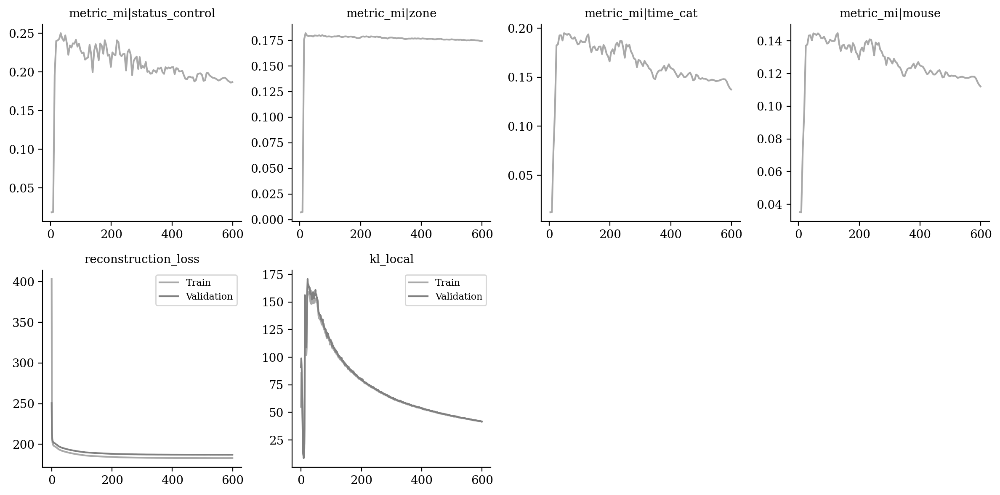

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

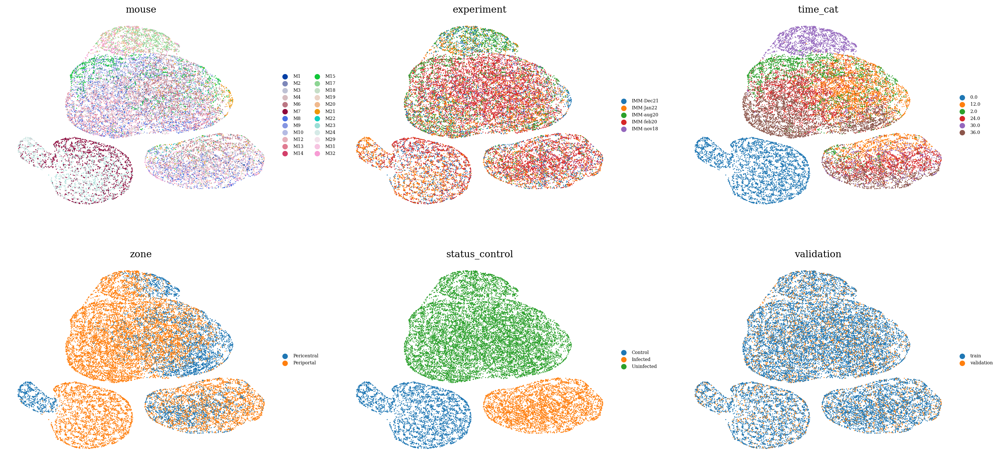

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

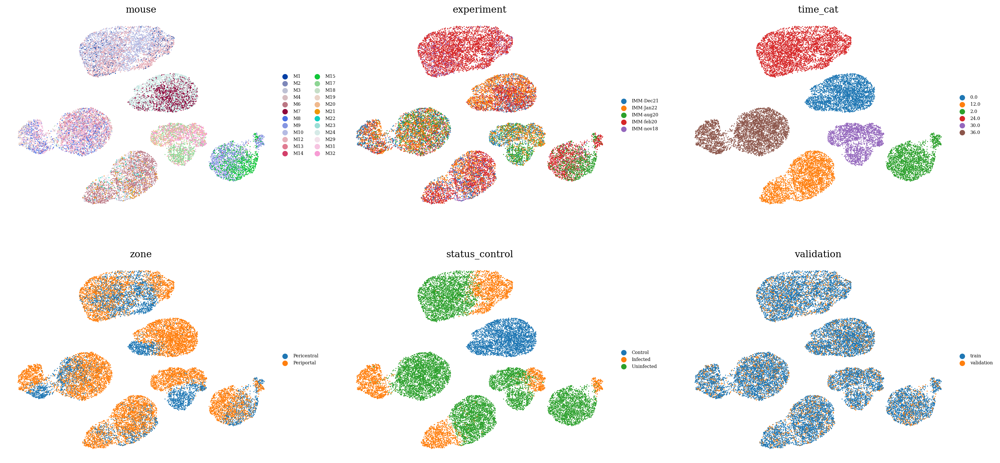

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

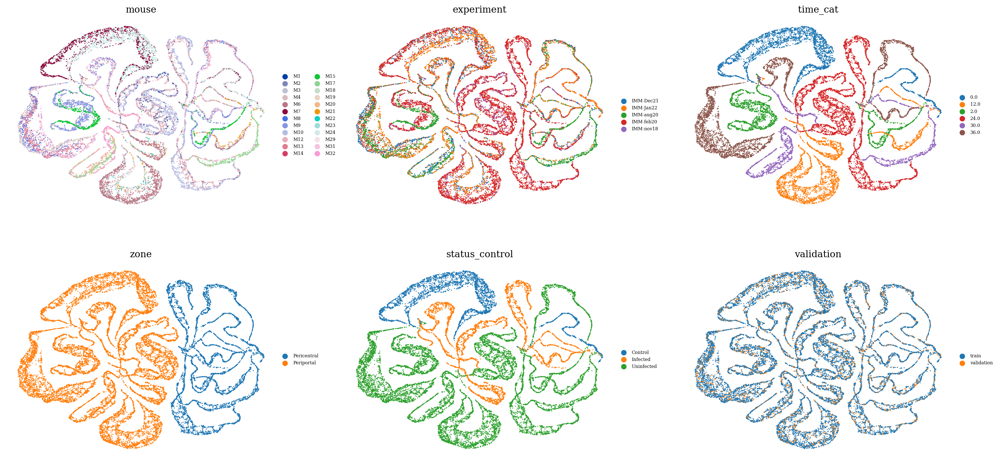

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

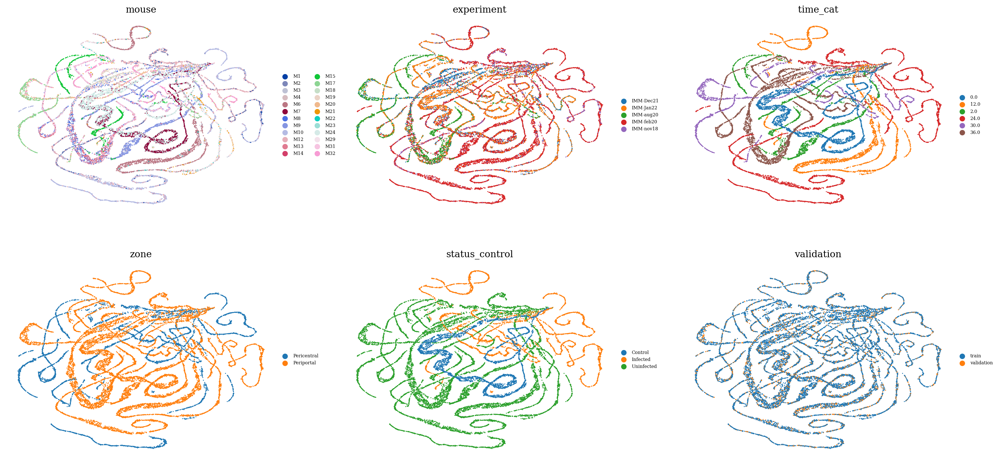

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

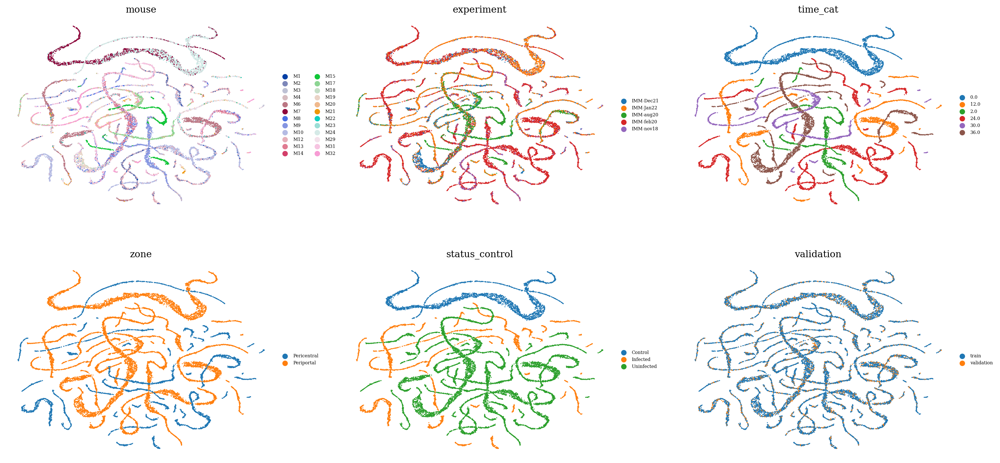

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.8220586256748502

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.7774508988512877

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9962610964682673,
 ('validation', 'unreserved'): 0.17277934769244135,
 ('train', 'reserved'): 0.9956097445582293,
 ('train', 'unreserved'): 0.1310271414150968}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9521445108026733,
 ('validation', 'unreserved'): 0.3206972555210575,
 ('train', 'reserved'): 0.9479265066737593,
 ('train', 'unreserved'): 0.271888346163744}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9648826844442226,
 ('validation', 'unreserved'): 0.2596410284700508,
 ('train', 'reserved'): 0.9628341460282218,
 ('train', 'unreserved'): 0.1885620633528954}